In [121]:
import numpy as np
import scanpy as sc
import pandas as pd

In [122]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.9.1 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.8


Read in the AnnData file.

In [123]:
adata = sc.read_h5ad("/Volumes/NAME/deconvolution-project/filtered_MS_nuclei_hashing_gx12.h5ad")
print(adata)

AnnData object with n_obs × n_vars = 4889 × 33694
    var: 'gene_ids', 'feature_types'


Read in the metadata and the doublet and donor labels by Xichen.

In [124]:
obs = pd.read_csv(
    "/Volumes/NAME/deconvolution-project/gx12_final_result_all.csv")
obs

,Barcode,donor_identity
0,ACTTATCTCATGCCAA-1,Hash453-TotalSeqA
1,GGGTCACAGCAGCAGT-1,Hash452-TotalSeqA
2,CAGAGCCGTTGGGATG-1,Hash451-TotalSeqA
3,GGTCACGTCGGTCTAA-1,Hash452-TotalSeqA
4,GACATCACATCAGCGC-1,Hash455-TotalSeqA
...,...,...
4884,ATGATCGTCATGCCAA-1,Hash453-TotalSeqA
4885,CCTCATGTCAAACGTC-1,Hash456-TotalSeqA
4886,TGTTACTCAAGACTGG-1,Hash455-TotalSeqA
4887,AACCACATCATGTCTT-1,Hash453-TotalSeqA


In [125]:
obs_vario = pd.read_csv(
    "/Volumes/NAME/deconvolution-project/gx12_vireo_assignment.csv", 
    usecols=["cell", "donor_id", "classification"])
obs_vario

,cell,donor_id,classification
0,AAACCCAAGGTGTGAC-1,donor1,singlet
1,AAACCCAGTGAGAGGG-1,donor2,singlet
2,AAACGAAAGAATCTAG-1,donor5,singlet
3,AAACGAACACATATGC-1,donor5,singlet
4,AAACGAACACGACTAT-1,donor5,singlet
...,...,...,...
4884,TTTGTTGAGTCCCAGC-1,donor2,singlet
4885,TTTGTTGCAGCGCGTT-1,doublet,doublet
4886,TTTGTTGGTTATCTTC-1,doublet,doublet
4887,TTTGTTGTCCAGTGTA-1,donor0,singlet


In [126]:
obs_meta_sel = pd.read_csv(
    "/Volumes/NAME/deconvolution-project/adataobs_MSmultiplex_DendrouSchirmerJakel_integrated.csv", 
    usecols=["cluster_label", "lowres_cluster_label", "sample_id", "batch"])
obs_meta_sel.head()

,sample_id,batch,cluster_label,lowres_cluster_label
0,704193_GX53,0,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro
1,704193_GX53,0,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro
2,704193_GX53,0,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro
3,704193_GX53,0,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro
4,704193_GX53,0,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro


In [127]:
obs_meta_all = pd.read_csv("/Volumes/NAME/deconvolution-project/adataobs_MSmultiplex_DendrouSchirmerJakel_integrated.csv", index_col=0, low_memory=False)
obs_meta_all.head()

,sample_id,batch,antibody,library_id,patient,block_position,demult_sample_id,disorder,disease_type,age,...,tissue,library,brain_region,leiden_res_0.1,leiden_res_0.3,leiden_res_0.5,leiden_res_1,cluster_label,lowres_cluster_label,bucket
AAACGCTTCGTAGGAG-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
AAAGGATTCATGCGGC-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
AAAGGATTCGCTTAAG-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
AAAGGTAAGGCCTTCG-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes
AACAAAGTCCGATAAC-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes


Set Index of metadata as a column. Cut all information after barcode.

In [128]:
obs_meta_all.reset_index(inplace=True)
obs_meta_all['index'] = obs_meta_all['index'].str[:18]
obs_meta_all.head()

,index,sample_id,batch,antibody,library_id,patient,block_position,demult_sample_id,disorder,disease_type,...,tissue,library,brain_region,leiden_res_0.1,leiden_res_0.3,leiden_res_0.5,leiden_res_1,cluster_label,lowres_cluster_label,bucket
0,AAACGCTTCGTAGGAG-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
1,AAAGGATTCATGCGGC-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
2,AAAGGATTCGCTTAAG-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
3,AAAGGTAAGGCCTTCG-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes
4,AACAAAGTCCGATAAC-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes


Filter by gx12 in sample_id (not case-sensitive).

In [129]:
obs_meta_all_gx12 = obs_meta_all[obs_meta_all['sample_id'].str.contains('gx12', case=False)]
obs_meta_all_gx12

,index,sample_id,batch,antibody,library_id,patient,block_position,demult_sample_id,disorder,disease_type,...,tissue,library,brain_region,leiden_res_0.1,leiden_res_0.3,leiden_res_0.5,leiden_res_1,cluster_label,lowres_cluster_label,bucket
411,AAAGGGCCAATTTCCT-1,747495_GX12,1,Hash453,747495_GX12,C005,P2D4,747495_GX12_3,control,none,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
412,AACAAGACAACTGGTT-1,747495_GX12,1,Hash451,747495_GX12,C014_d,P5C3,747495_GX12_1,control,none,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes
413,AACCACAGTTCCGGTG-1,747495_GX12,1,Hash451,747495_GX12,C014_d,P5C3,747495_GX12_1,control,none,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
414,AACCCAACACTCTCGT-1,747495_GX12,1,Hash456,747495_GX12,MS425,A3A2,747495_GX12_6,ms,SP,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
415,AAGCATCAGAGTCTTC-1,747495_GX12,1,Hash454,747495_GX12,MS438,P2D4,747495_GX12_4,ms,Undetermined,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44550,TTTCGATCAGTTAGGG-1,747495_GX12,1,Hash454,747495_GX12,MS438,P2D4,747495_GX12_4,ms,Undetermined,...,NaN,NaN,NaN,1,1,1,2,CUX2_LAMP5_YWHAHhi,CUX2,neurons
44551,TTTCGATGTGTCGATT-1,747495_GX12,1,Hash451,747495_GX12,C014_d,P5C3,747495_GX12_1,control,none,...,NaN,NaN,NaN,9,10,9,8,FEZF2_SEMA3Ehi,FEZF2,neurons
44552,TTTGGAGTCGAGAATA-1,747495_GX12,1,Hash451,747495_GX12,C014_d,P5C3,747495_GX12_1,control,none,...,NaN,NaN,NaN,3,9,8,9,RORB_TOXhi_ARHGAP15hi,RORB,neurons
44553,TTTGGTTAGATAGGGA-1,747495_GX12,1,Hash455,747495_GX12,C064,A2D1,747495_GX12_5,control,none,...,NaN,NaN,NaN,5,7,6,6,VIP_HGFAC,VIP,neurons


Merge Xichen's vireo data with the new data to get the correct order.

In [130]:
obs_ordered = pd.merge(obs_vario, obs, left_on='cell', right_on='Barcode', how='outer')
obs_ordered

,cell,donor_id,classification,Barcode,donor_identity
0,AAACCCAAGGTGTGAC-1,donor1,singlet,AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA
1,AAACCCAGTGAGAGGG-1,donor2,singlet,AAACCCAGTGAGAGGG-1,Hash453-TotalSeqA
2,AAACGAAAGAATCTAG-1,donor5,singlet,AAACGAAAGAATCTAG-1,Hash452-TotalSeqA
3,AAACGAACACATATGC-1,donor5,singlet,AAACGAACACATATGC-1,Hash452-TotalSeqA
4,AAACGAACACGACTAT-1,donor5,singlet,AAACGAACACGACTAT-1,Hash452-TotalSeqA
...,...,...,...,...,...
4884,TTTGTTGAGTCCCAGC-1,donor2,singlet,TTTGTTGAGTCCCAGC-1,Hash453-TotalSeqA
4885,TTTGTTGCAGCGCGTT-1,doublet,doublet,TTTGTTGCAGCGCGTT-1,doublet
4886,TTTGTTGGTTATCTTC-1,doublet,doublet,TTTGTTGGTTATCTTC-1,doublet
4887,TTTGTTGTCCAGTGTA-1,donor0,singlet,TTTGTTGTCCAGTGTA-1,Hash454-TotalSeqA


Merge Xichens obs information and the metadata for gx12. Not all cells have a match in the gx12. Here NaN is put in for those columns.

In [131]:
merged_obs = pd.merge(obs_ordered, obs_meta_all_gx12, left_on='cell', right_on='index', how='outer')
merged_obs

,cell,donor_id,classification,Barcode,donor_identity,index,sample_id,batch,antibody,library_id,...,tissue,library,brain_region,leiden_res_0.1,leiden_res_0.3,leiden_res_0.5,leiden_res_1,cluster_label,lowres_cluster_label,bucket
0,AAACCCAAGGTGTGAC-1,donor1,singlet,AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA,AAACCCAAGGTGTGAC-1,747495_GX12,1,Hash451,747495_GX12,...,NaN,NaN,NaN,1.0,1.0,1.0,2.0,CUX2_PALMDpos_FREM3pos,CUX2,neurons
1,AAACCCAGTGAGAGGG-1,donor2,singlet,AAACCCAGTGAGAGGG-1,Hash453-TotalSeqA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AAACGAAAGAATCTAG-1,donor5,singlet,AAACGAAAGAATCTAG-1,Hash452-TotalSeqA,AAACGAAAGAATCTAG-1,747495_GX12,1,Hash452,747495_GX12,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,OG - OPALINlow_SLC5A11hi_RBFOXhi,OG - OPALINlow_SLC5A11hi_RBFOXhi,oligodendrocytes
3,AAACGAACACATATGC-1,donor5,singlet,AAACGAACACATATGC-1,Hash452-TotalSeqA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AAACGAACACGACTAT-1,donor5,singlet,AAACGAACACGACTAT-1,Hash452-TotalSeqA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4884,TTTGTTGAGTCCCAGC-1,donor2,singlet,TTTGTTGAGTCCCAGC-1,Hash453-TotalSeqA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4885,TTTGTTGCAGCGCGTT-1,doublet,doublet,TTTGTTGCAGCGCGTT-1,doublet,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4886,TTTGTTGGTTATCTTC-1,doublet,doublet,TTTGTTGGTTATCTTC-1,doublet,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4887,TTTGTTGTCCAGTGTA-1,donor0,singlet,TTTGTTGTCCAGTGTA-1,Hash454-TotalSeqA,TTTGTTGTCCAGTGTA-1,747495_GX12,1,Hash454,747495_GX12,...,NaN,NaN,NaN,1.0,1.0,1.0,2.0,CUX2_PALMDpos_FREM3pos,CUX2,neurons


Changing names of some columns to paper_X to not interfere with later column generation.

In [132]:
merged_obs = merged_obs.rename(columns={'doublet_scores' : 'paper_doublet_scores', 'predicted_doublets': 'paper_predicted_doublets'})

Adding only a few selected columns to not interfere with later doubled column labeling by further analysis.

In [133]:
merged_obs_sel = merged_obs.loc[:, ["Barcode", "donor_identity", "donor_id", "cluster_label", "lowres_cluster_label", "sample_id", "bucket", "disorder", "paper_doublet_scores", "paper_predicted_doublets"]]
merged_obs_sel.set_index('Barcode', inplace=True)
merged_obs_sel

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets
Barcode,,,,,,,,,
AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA,donor1,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,control,0.043699,False
AAACCCAGTGAGAGGG-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACGAAAGAATCTAG-1,Hash452-TotalSeqA,donor5,OG - OPALINlow_SLC5A11hi_RBFOXhi,OG - OPALINlow_SLC5A11hi_RBFOXhi,747495_GX12,oligodendrocytes,ms,0.031493,False
AAACGAACACATATGC-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACGAACACGACTAT-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
TTTGTTGAGTCCCAGC-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TTTGTTGCAGCGCGTT-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TTTGTTGGTTATCTTC-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [134]:
adata.obs = merged_obs_sel
adata.obs.head()

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets
Barcode,,,,,,,,,
AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA,donor1,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,control,0.043699,False
AAACCCAGTGAGAGGG-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACGAAAGAATCTAG-1,Hash452-TotalSeqA,donor5,OG - OPALINlow_SLC5A11hi_RBFOXhi,OG - OPALINlow_SLC5A11hi_RBFOXhi,747495_GX12,oligodendrocytes,ms,0.031493,False
AAACGAACACATATGC-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACGAACACGACTAT-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [135]:
adata

AnnData object with n_obs × n_vars = 4889 × 33694
    obs: 'donor_identity', 'donor_id', 'cluster_label', 'lowres_cluster_label', 'sample_id', 'bucket', 'disorder', 'paper_doublet_scores', 'paper_predicted_doublets'
    var: 'gene_ids', 'feature_types'

In [136]:
adata.var_names_make_unique()

In [137]:
adata.shape

(4889, 33694)

Doublet score generation via scrublet.

In [138]:
import scrublet as scr
scrub = scr.Scrublet(adata.X)
doublet_scores, predicted_doublets = scrub.scrub_doublets()

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.57
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 11.3 seconds


In [139]:
print(doublet_scores)

[0.07637232 0.12479741 0.06861642 ... 0.25414365 0.11987382 0.04020979]


In [140]:
adata.obs['doublet_score'] = doublet_scores

Start of filtering and QC.

normalizing counts per cell
    finished (0:00:00)


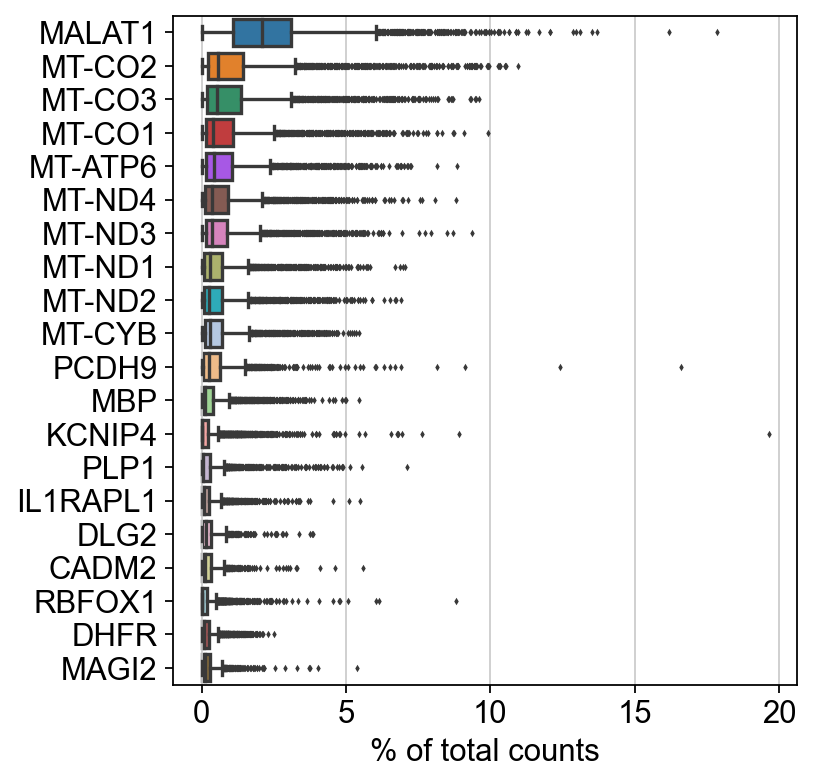

In [141]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [142]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 1 cells that have less than 200 genes expressed
filtered out 7714 genes that are detected in less than 3 cells


In [143]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

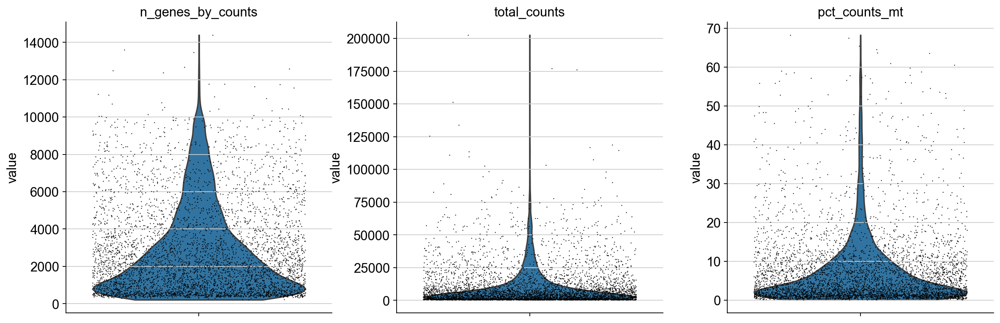

In [144]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

Check for the probable cutoff used in the dataset by the previous MS analysis. (10%, supported by their methods section)

In [145]:
print(obs_meta_all_gx12["pct_counts_mt"].max())
print(obs_meta_all_gx12["n_genes_by_counts"].max())

9.982435
10849


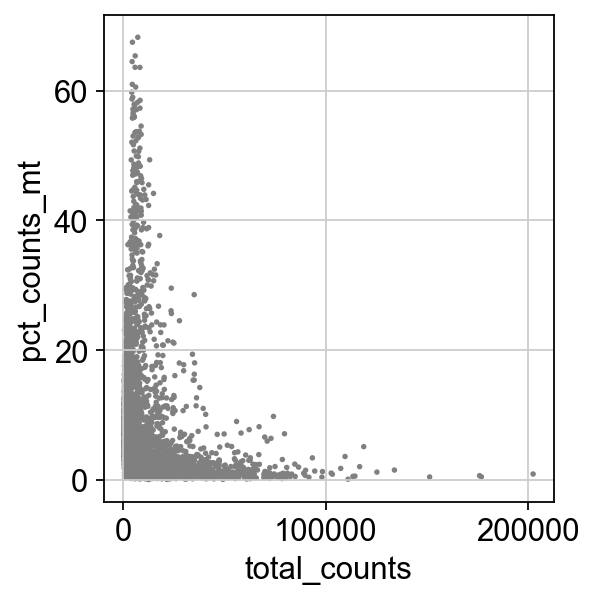

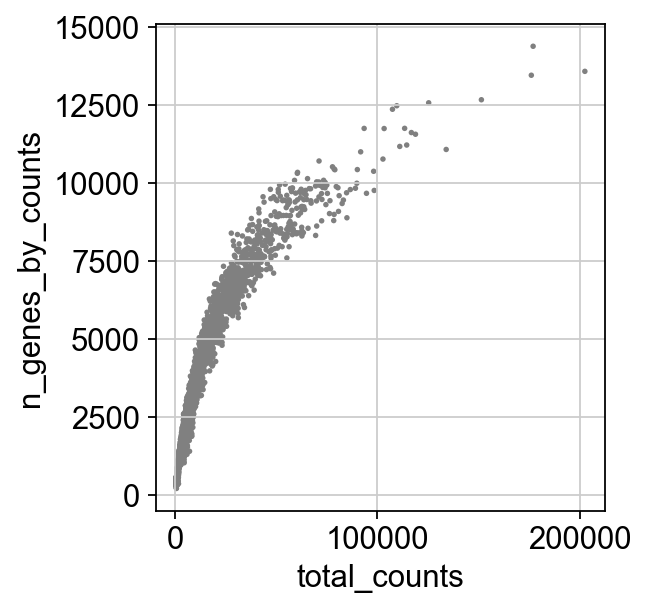

In [146]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [147]:
adata = adata[adata.obs.n_genes_by_counts < 10849, :] # adjusted 2500 to 10894 by previous analysis
adata = adata[adata.obs.pct_counts_mt < 10, :] # under 10 percent as probable cutoff

In [148]:
sc.pp.normalize_total(adata, target_sum=1e4)

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


In [149]:
sc.pp.log1p(adata)

In [150]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


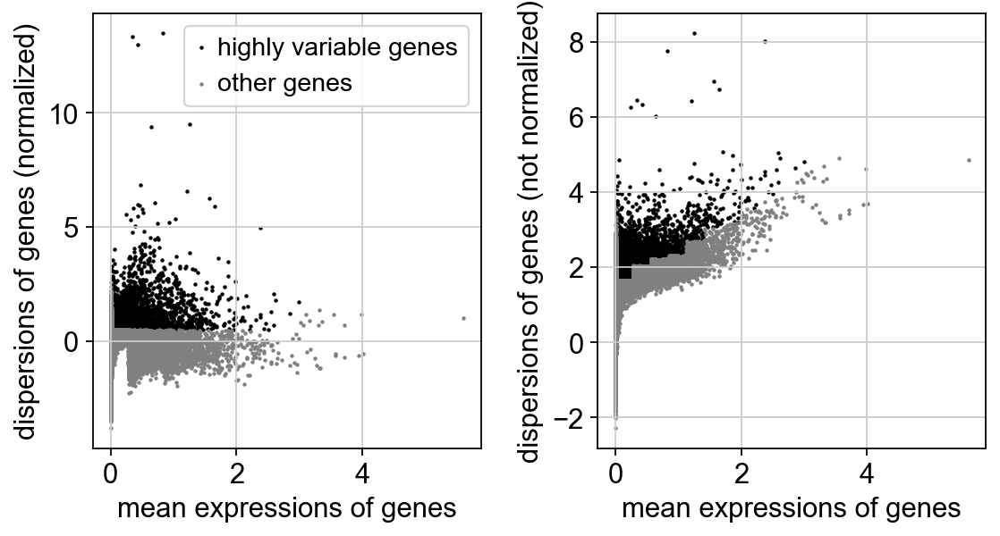

In [151]:
sc.pl.highly_variable_genes(adata)

In [152]:
adata.raw = adata

In [153]:
adata = adata[:, adata.var.highly_variable]

In [154]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:36)


In [155]:
sc.pp.scale(adata, max_value=10)

In [156]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


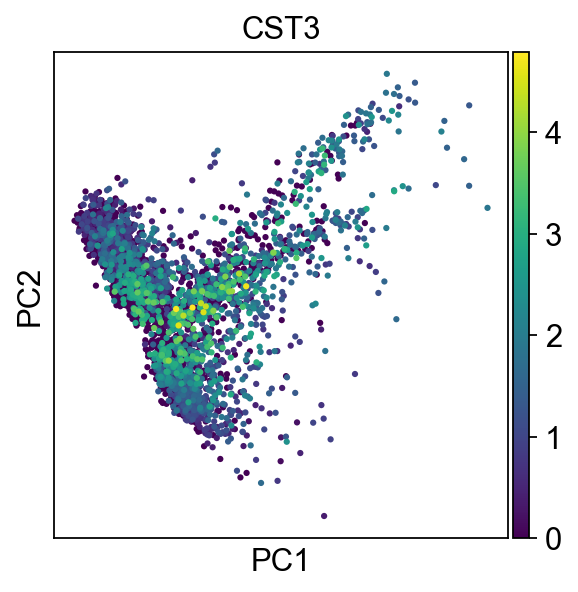

In [157]:
sc.pl.pca(adata, color='CST3')

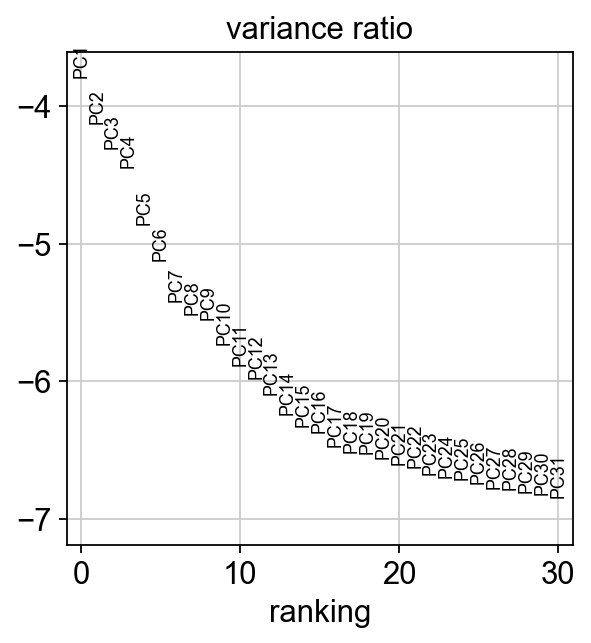

In [158]:
sc.pl.pca_variance_ratio(adata, log=True)

In [159]:
# adata.write(results_file)

In [160]:
adata

AnnData object with n_obs × n_vars = 3797 × 7584
    obs: 'donor_identity', 'donor_id', 'cluster_label', 'lowres_cluster_label', 'sample_id', 'bucket', 'disorder', 'paper_doublet_scores', 'paper_predicted_doublets', 'doublet_score', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [161]:
sc.pp.neighbors(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [162]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


In [163]:
print(adata.obs)

                       donor_identity donor_id  \
Barcode                                          
AAACCCAAGGTGTGAC-1  Hash451-TotalSeqA   donor1   
AAACGAAAGAATCTAG-1  Hash452-TotalSeqA   donor5   
AAACGAACACATATGC-1  Hash452-TotalSeqA   donor5   
AAACGAACATCAGCAT-1  Hash454-TotalSeqA   donor0   
AAACGAAGTGCCGTAC-1            doublet  doublet   
...                               ...      ...   
TTTGGTTAGCACTCAT-1  Hash455-TotalSeqA   donor4   
TTTGTTGAGTCCCAGC-1  Hash453-TotalSeqA   donor2   
TTTGTTGGTTATCTTC-1            doublet  doublet   
TTTGTTGTCCAGTGTA-1  Hash454-TotalSeqA   donor0   
TTTGTTGTCGCTTAAG-1  Hash451-TotalSeqA   donor1   

                                       cluster_label  \
Barcode                                                
AAACCCAAGGTGTGAC-1            CUX2_PALMDpos_FREM3pos   
AAACGAAAGAATCTAG-1  OG - OPALINlow_SLC5A11hi_RBFOXhi   
AAACGAACACATATGC-1                               NaN   
AAACGAACATCAGCAT-1                               NaN   
AAACGAAGTGCCG

In [164]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [165]:
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)
sc.tl.leiden(adata, key_added="leiden_res2", resolution=2.0)

running Leiden clustering
    finished: found 12 clusters and added
    'leiden_res0_25', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_res0_5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden_res1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 35 clusters and added
    'leiden_res2', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


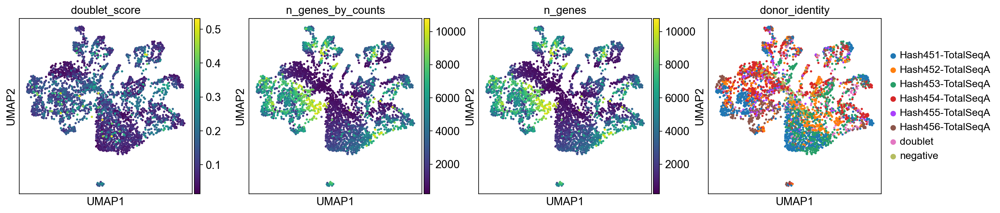

In [166]:
sc.pl.umap(adata, color=['doublet_score', 'n_genes_by_counts', 'n_genes', 'donor_identity'])

Add a column to adata.obs that only shows doublet vs. no doublet.

In [167]:
doublet_boolean = adata.obs['donor_identity'].str.contains("doublet")
adata.obs['doublet_classification_pipeline'] = ['doublet' if result else 'no doublet' for result in doublet_boolean]

In [168]:
adata.obs

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets,doublet_score,...,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,leiden_res0_25,leiden_res0_5,leiden_res1,leiden_res2,doublet_classification_pipeline
Barcode,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA,donor1,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,control,0.043699,False,0.076372,...,5147,21181.0,248.0,1.170861,4,2,2,4,7,no doublet
AAACGAAAGAATCTAG-1,Hash452-TotalSeqA,donor5,OG - OPALINlow_SLC5A11hi_RBFOXhi,OG - OPALINlow_SLC5A11hi_RBFOXhi,747495_GX12,oligodendrocytes,ms,0.031493,False,0.068616,...,1137,1954.0,37.0,1.893552,0,0,1,0,3,no doublet
AAACGAACACATATGC-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.025223,...,892,1238.0,75.0,6.058158,2,1,4,2,0,no doublet
AAACGAACATCAGCAT-1,Hash454-TotalSeqA,donor0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.024176,...,3065,6661.0,499.0,7.491367,2,1,4,2,21,no doublet
AAACGAAGTGCCGTAC-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.305466,...,3440,8929.0,610.0,6.831672,4,2,2,4,32,doublet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTAGCACTCAT-1,Hash455-TotalSeqA,donor4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.066225,...,2087,6276.0,154.0,2.453792,10,3,3,10,15,no doublet
TTTGTTGAGTCCCAGC-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.017520,...,481,632.0,23.0,3.639241,0,0,1,0,25,no doublet
TTTGTTGGTTATCTTC-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.254144,...,7033,42240.0,305.0,0.722064,13,9,11,13,20,doublet


/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


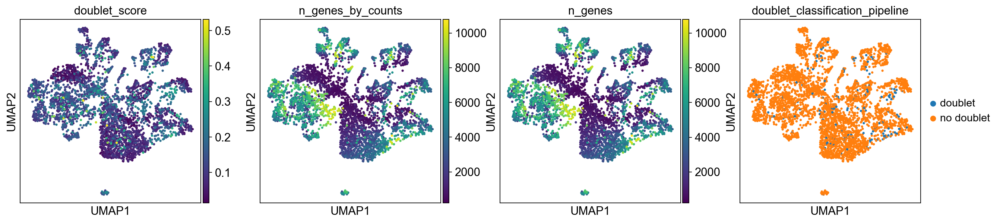

In [169]:
sc.pl.umap(adata, color=['doublet_score', 'n_genes_by_counts', 'n_genes', 'doublet_classification_pipeline'])

Generating a column that labels all NaN cells in the bucket column as new. Then combine these with the leiden_clustering.

In [170]:
adata.obs['newold'] = np.where(pd.isna(adata.obs['bucket']), 'new', 'old')
adata.obs["leiden_new_old"]=adata.obs['leiden'].str.cat(adata.obs['newold'], sep='_')
adata.obs["leiden_res0_25_new_old"]=adata.obs['leiden_res0_25'].str.cat(adata.obs['newold'], sep='_')

Plotting Violin plots to compare the new and paper given doublet scores.

Text(0.5, 1.0, 'Comparison of Doublet Scores between paper scores and newly generated scores with new cells included')

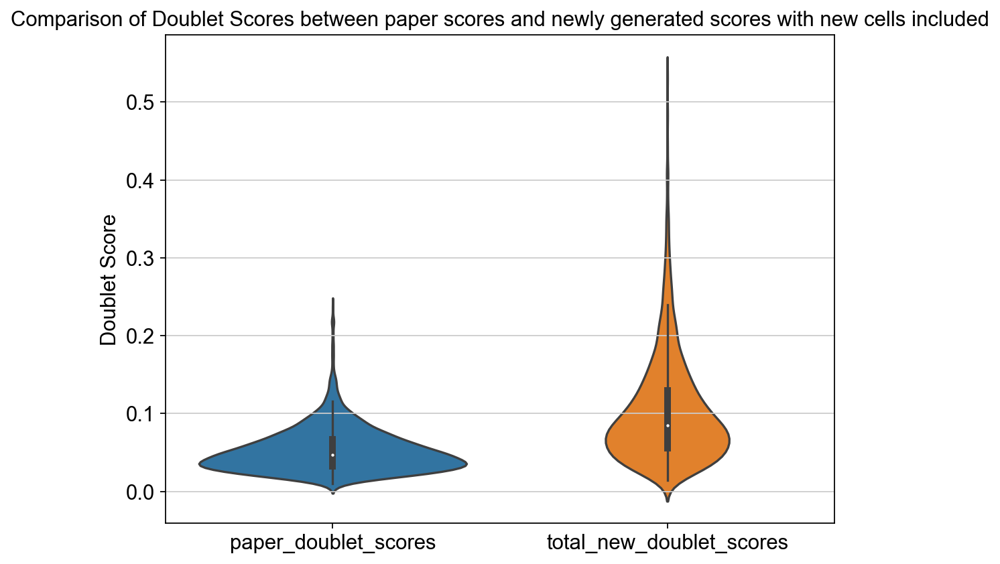

In [171]:
import matplotlib.pyplot as plt
import seaborn as sns

paper_doublet_scores = adata.obs["paper_doublet_scores"]

doublet_scores_df = pd.DataFrame({'paper_doublet_scores': paper_doublet_scores, 'total_new_doublet_scores': adata.obs["doublet_score"]})

plt.figure(figsize=(8, 6))
sns.violinplot(data=doublet_scores_df, save="violet_doublets_all_cells.png")
plt.ylabel('Doublet Score')
plt.title('Comparison of Doublet Scores between paper scores and newly generated scores with new cells included')

Text(0.5, 1.0, 'Comparison of Doublet Scores between paper scores and newly generated scores without new cells included')

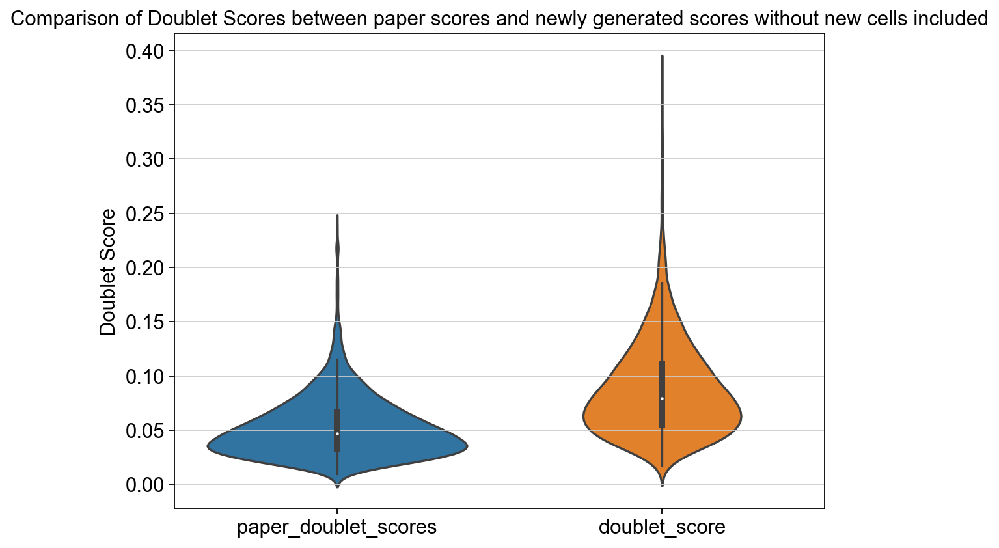

In [172]:
adata_old = adata[adata.obs['newold'] == 'old']

data_to_plot = adata_old.obs.loc[:, ['paper_doublet_scores', 'doublet_score']]

plt.figure(figsize=(8, 6))
sns.violinplot(data=data_to_plot, save="violet_doublets_old_cells.png")
plt.ylabel('Doublet Score')
plt.title('Comparison of Doublet Scores between paper scores and newly generated scores without new cells included')

Text(0.5, 1.0, 'Comparison of Doublet Scores between paper scores and newly generated scores with new cells included')

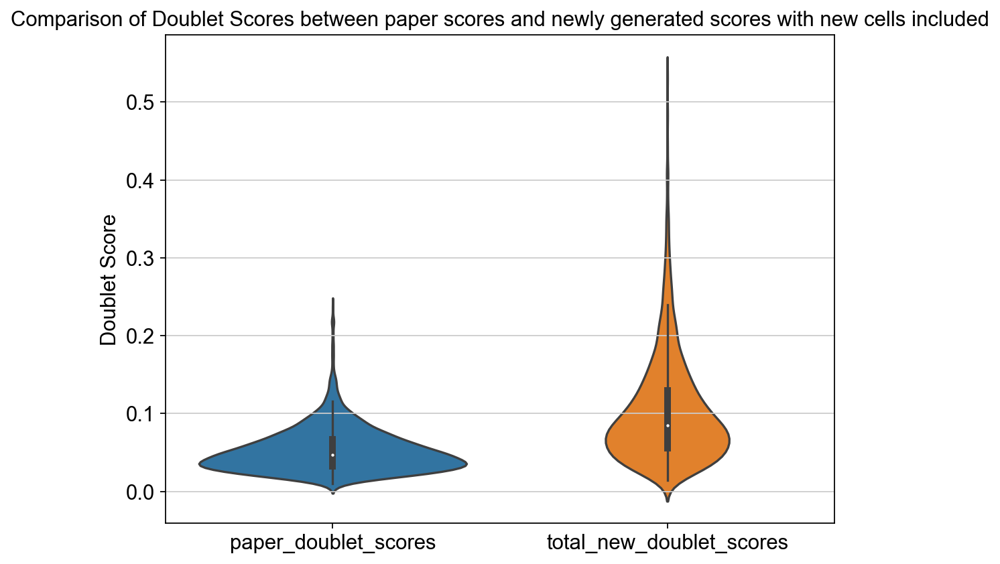

In [174]:
paper_doublet_scores = adata.obs["paper_doublet_scores"]

doublet_scores_df_2 = pd.DataFrame({'paper_doublet_scores': paper_doublet_scores, 'total_new_doublet_scores': adata.obs["doublet_score"]})

plt.figure(figsize=(8, 6))
sns.violinplot(data=doublet_scores_df, save=".png")
plt.ylabel('Doublet Score')
plt.title('Comparison of Doublet Scores between paper scores and newly generated scores with new cells included')

Plotting the cell type description the paper gave over all cells including the new ones to identify clusters.

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


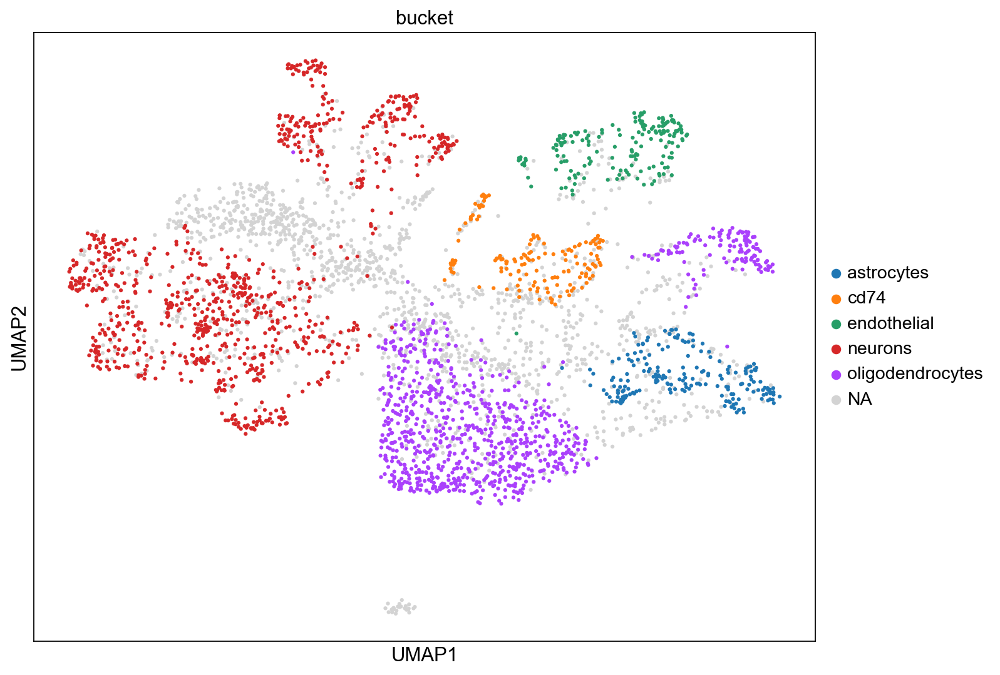

In [175]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10, 8))
plt.show(sc.pl.umap(adata, color=["bucket"], ax=ax))

Plotting a donor_id colored umap.

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


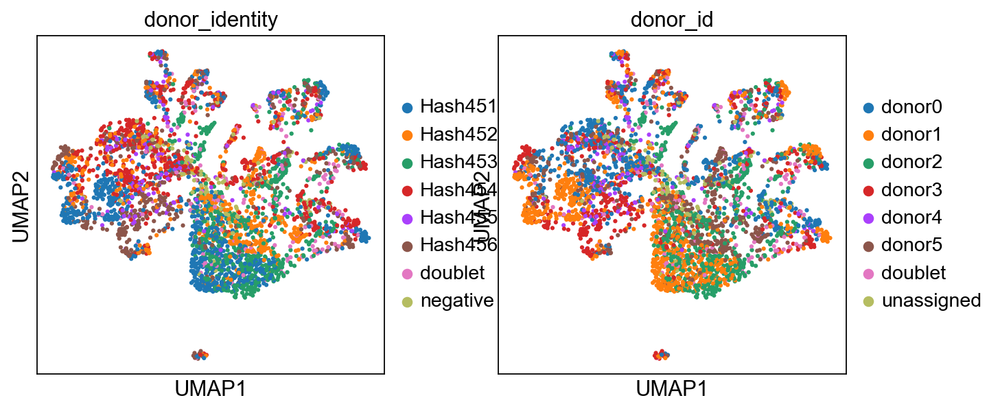

In [176]:
sc.pl.umap(adata, save=".png", color=["donor_identity", "donor_id"])

Excluding cells that had no donor_id and plot them.

                       donor_identity donor_id  \
Barcode                                          
AAACCCAAGGTGTGAC-1  Hash451-TotalSeqA   donor1   
AAACGAAAGAATCTAG-1  Hash452-TotalSeqA   donor5   
AAACGAACACATATGC-1  Hash452-TotalSeqA   donor5   
AAACGAACATCAGCAT-1  Hash454-TotalSeqA   donor0   
AAACGAAGTGCCGTAC-1            doublet  doublet   
...                               ...      ...   
TTTGGTTAGCACTCAT-1  Hash455-TotalSeqA   donor4   
TTTGTTGAGTCCCAGC-1  Hash453-TotalSeqA   donor2   
TTTGTTGGTTATCTTC-1            doublet  doublet   
TTTGTTGTCCAGTGTA-1  Hash454-TotalSeqA   donor0   
TTTGTTGTCGCTTAAG-1  Hash451-TotalSeqA   donor1   

                                       cluster_label  \
Barcode                                                
AAACCCAAGGTGTGAC-1            CUX2_PALMDpos_FREM3pos   
AAACGAAAGAATCTAG-1  OG - OPALINlow_SLC5A11hi_RBFOXhi   
AAACGAACACATATGC-1                               NaN   
AAACGAACATCAGCAT-1                               NaN   
AAACGAAGTGCCG

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


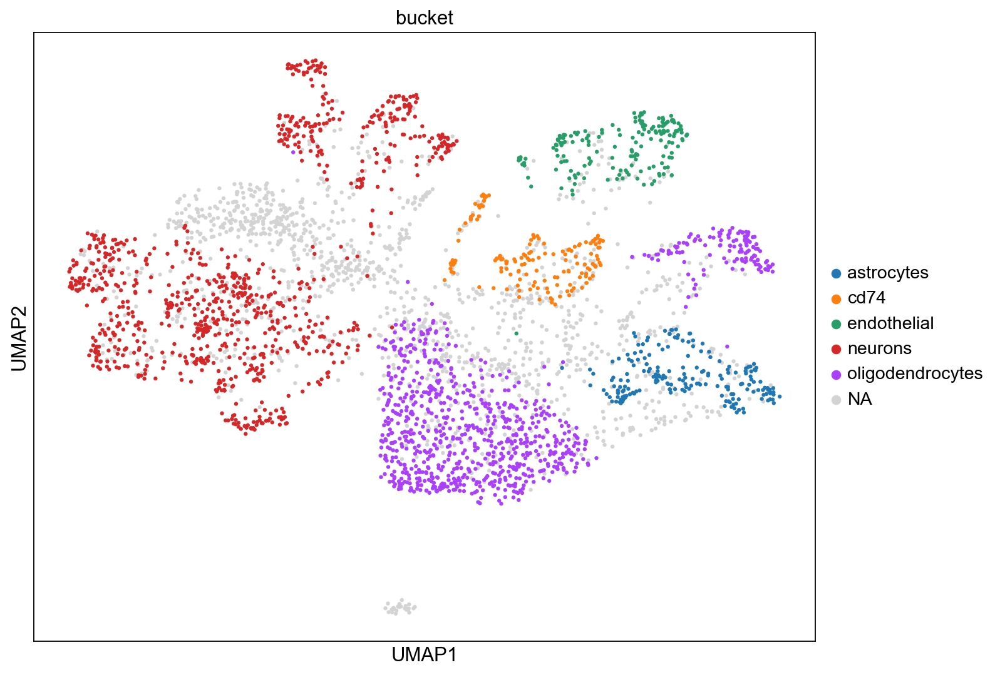

In [177]:
adata_donor_assigned = adata[~(adata.obs['donor_identity'] == 'negative'), :]
print(adata_donor_assigned.obs)
fig, ax = plt.subplots(figsize=(10, 8))
plt.show(sc.pl.umap(adata_donor_assigned, color=["bucket"], ax=ax))

Used Xichens doublet prediction to filter out doublets.

In [178]:
adata_donor_assigned_no_doublets = adata_donor_assigned[~(adata_donor_assigned.obs['donor_identity'] == 'doublet'), :]
print(adata_donor_assigned_no_doublets)

View of AnnData object with n_obs × n_vars = 3462 × 7584
    obs: 'donor_identity', 'donor_id', 'cluster_label', 'lowres_cluster_label', 'sample_id', 'bucket', 'disorder', 'paper_doublet_scores', 'paper_predicted_doublets', 'doublet_score', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'doublet_classification_pipeline', 'newold', 'leiden_new_old', 'leiden_res0_25_new_old'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'donor_identity_colors', 'doublet_classification_pipeline_colors', 'bucket_colors', 'donor_id_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


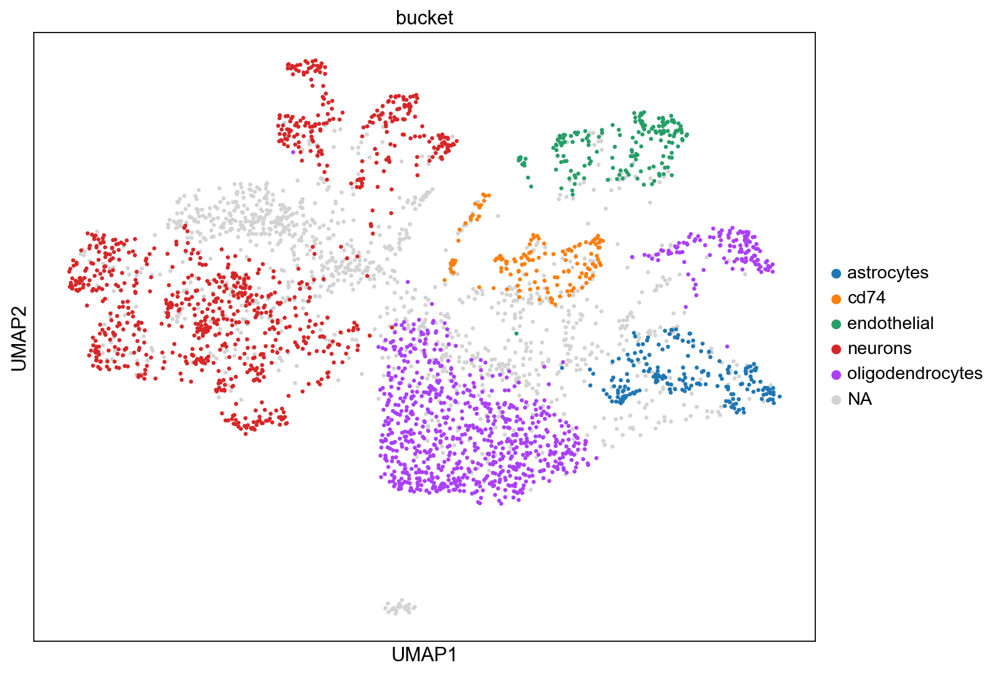

In [179]:
fig, ax = plt.subplots(figsize=(10, 8))
plt.show(sc.pl.umap(adata_donor_assigned_no_doublets, color=["bucket"], ax=ax))

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


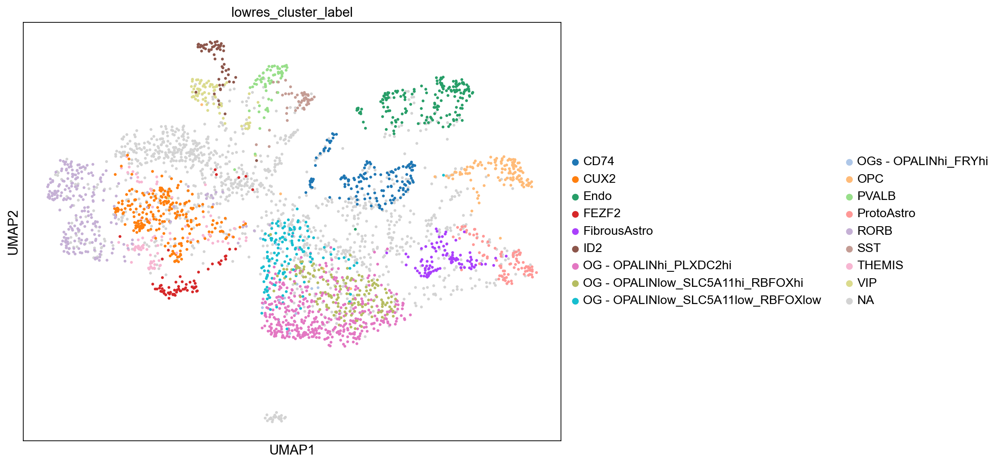

In [180]:
fig, ax = plt.subplots(figsize=(10, 8))
plt.show(sc.pl.umap(adata_donor_assigned_no_doublets, color=["lowres_cluster_label"], ax=ax))

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


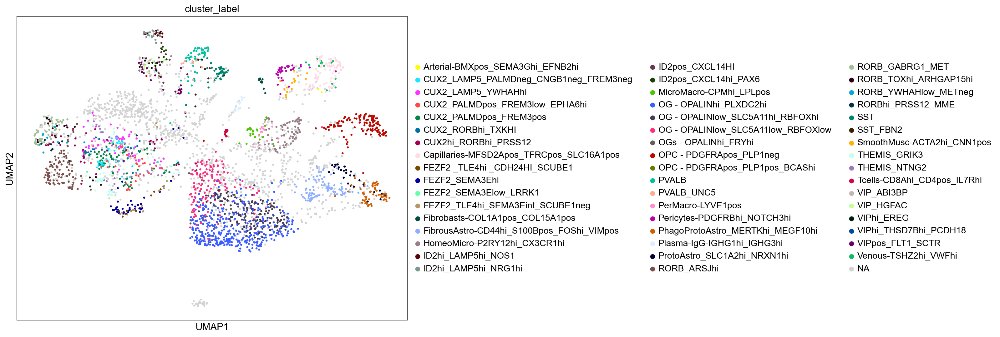

In [181]:
fig, ax = plt.subplots(figsize=(10, 8))
plt.show(sc.pl.umap(adata_donor_assigned_no_doublets, color=["cluster_label"], ax=ax))

Plotting doublet parameters after removal of Xichens doublets and unassigned.

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


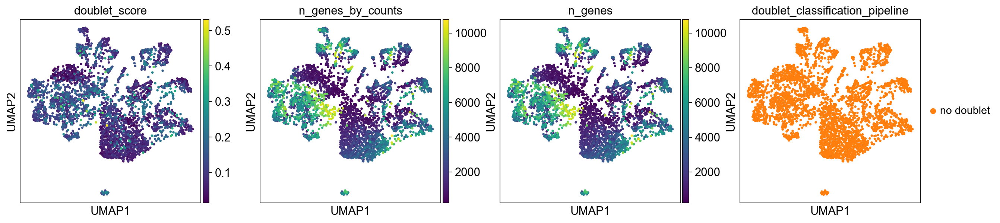

In [182]:
sc.pl.umap(adata_donor_assigned_no_doublets, color=['doublet_score', 'n_genes_by_counts', 'n_genes', 'doublet_classification_pipeline'])

Plotting leiden clusters.

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


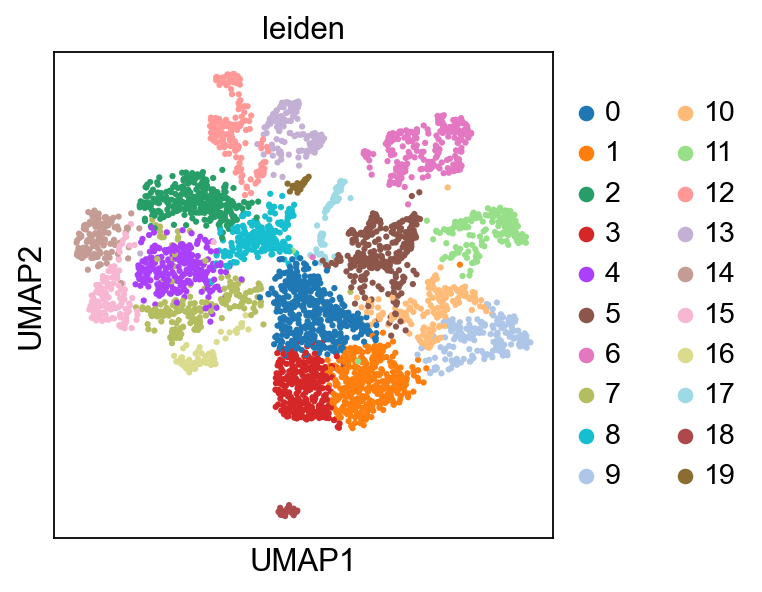

In [183]:
sc.pl.umap(adata, color=['leiden'])

Showing ranked genes by t-test.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


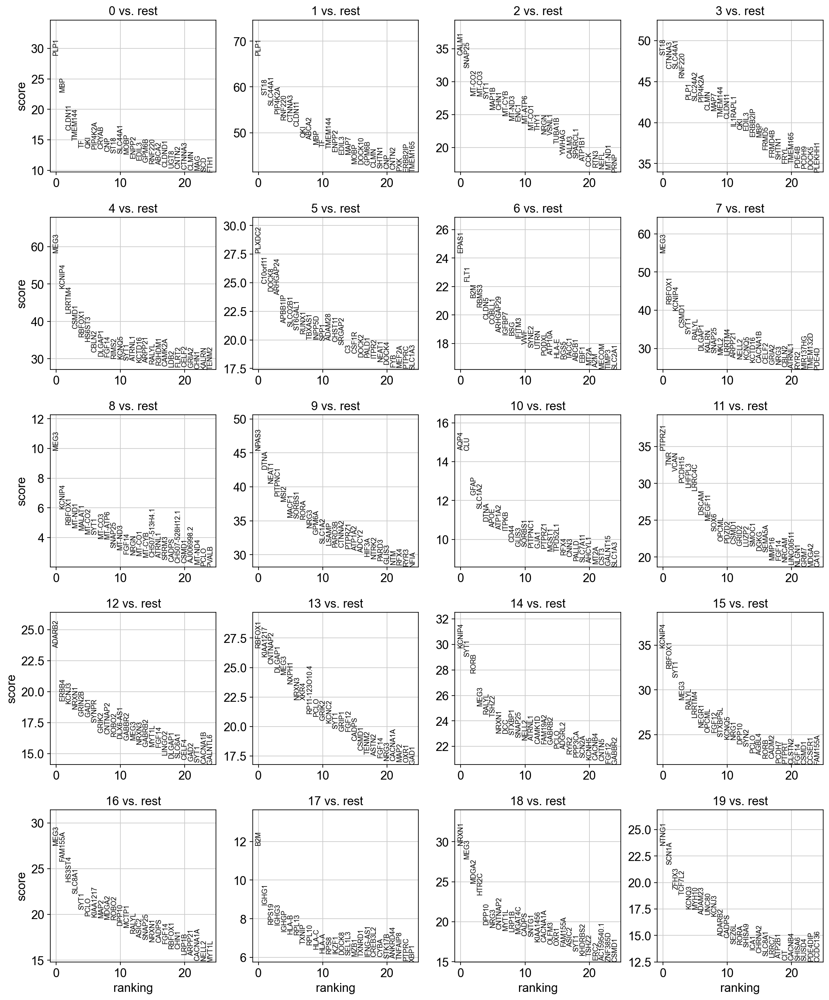

In [184]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [185]:
sc.settings.verbosity = 2  # reduce the verbosity

Showing ranked genes by wilcoxon.

ranking genes
    finished (0:00:13)


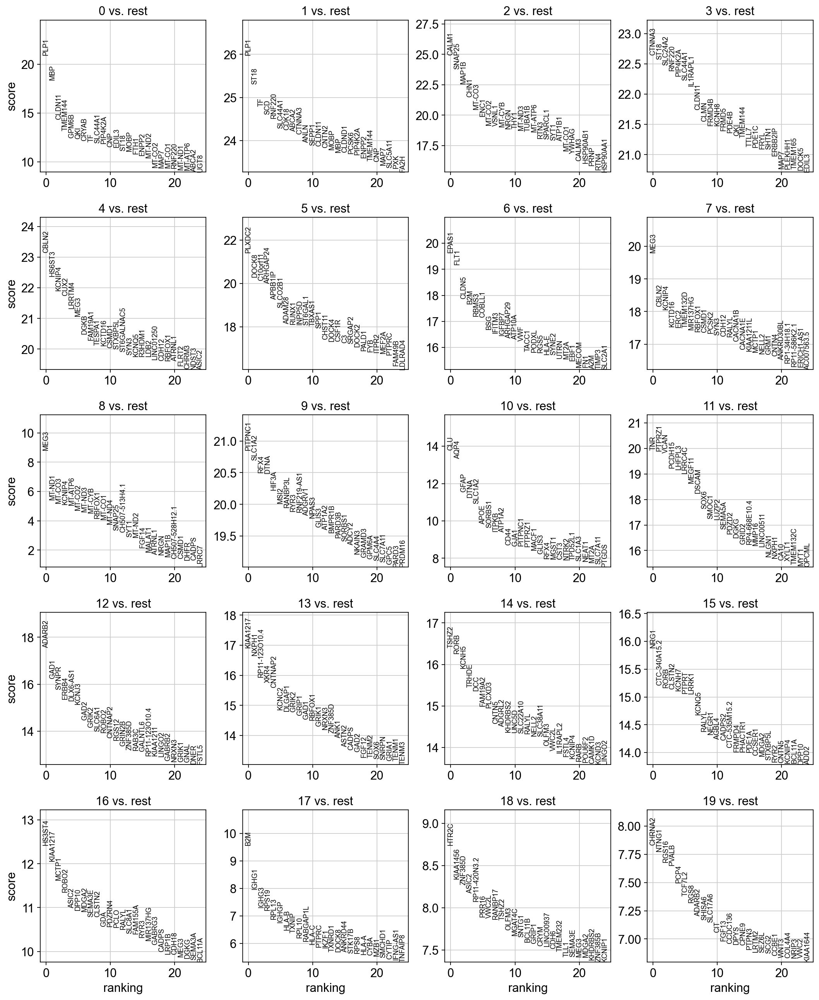

In [186]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

Plotting different leiden resolutions.

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


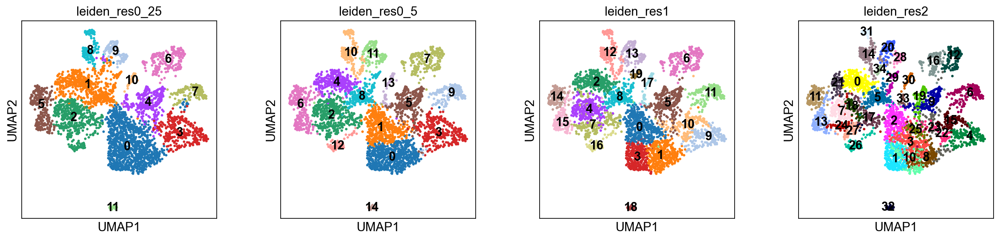

In [187]:
sc.pl.umap(
    adata,
    color=["leiden_res0_25", "leiden_res0_5", "leiden_res1", "leiden_res2"],
    legend_loc="on data",
)

Looking more closely at the new leiden cluster 18 with QC parameters. 

In [188]:
cluster_18 = adata.obs[adata.obs['leiden'] == '18']

In [189]:
cluster_18['doublet_score'].describe()

count    26.000000
mean      0.179815
std       0.062599
min       0.098748
25%       0.147541
50%       0.161165
75%       0.210280
max       0.407407
Name: doublet_score, dtype: float64

In [190]:
adata.obs['doublet_score'].describe()

count    3797.000000
mean        0.103373
std         0.069587
min         0.014175
25%         0.055499
50%         0.085133
75%         0.130000
max         0.531250
Name: doublet_score, dtype: float64

In [191]:
cluster_18['n_genes_by_counts'].describe()

count      26.000000
mean     4964.846154
std      1937.849647
min      1332.000000
25%      3210.500000
50%      5064.000000
75%      6539.250000
max      7875.000000
Name: n_genes_by_counts, dtype: float64

In [192]:
adata.obs['n_genes_by_counts'].describe()

count     3797.000000
mean      2974.596260
std       2461.782547
min        214.000000
25%        936.000000
50%       2213.000000
75%       4336.000000
max      10776.000000
Name: n_genes_by_counts, dtype: float64

In [193]:
cluster_18['n_genes'].describe()

count      26.000000
mean     4966.653846
std      1938.496468
min      1332.000000
25%      3211.250000
50%      5065.000000
75%      6541.750000
max      7877.000000
Name: n_genes, dtype: float64

In [194]:
adata.obs['n_genes'].describe()

count     3797.000000
mean      2975.326047
std       2462.705787
min        215.000000
25%        936.000000
50%       2213.000000
75%       4338.000000
max      10778.000000
Name: n_genes, dtype: float64

Showing that there are no NaN values or NA in the original metadata from the gx12-cells in the 'bucket' category. This means that all NaN values (all grey cells in the umap) are new cells.

In [195]:
number_nan_meta_all = obs_meta_all['bucket'].isna().sum()
print('Number of NaN values:', number_nan_meta_all)

Number of NaN values: 0


In [196]:
unique_values_gx12_bucket = obs_meta_all_gx12['bucket'].unique()
print(unique_values_gx12_bucket)

['astrocytes' 'oligodendrocytes' 'endothelial' 'cd74' 'neurons']


ranking genes
    finished (0:00:01)


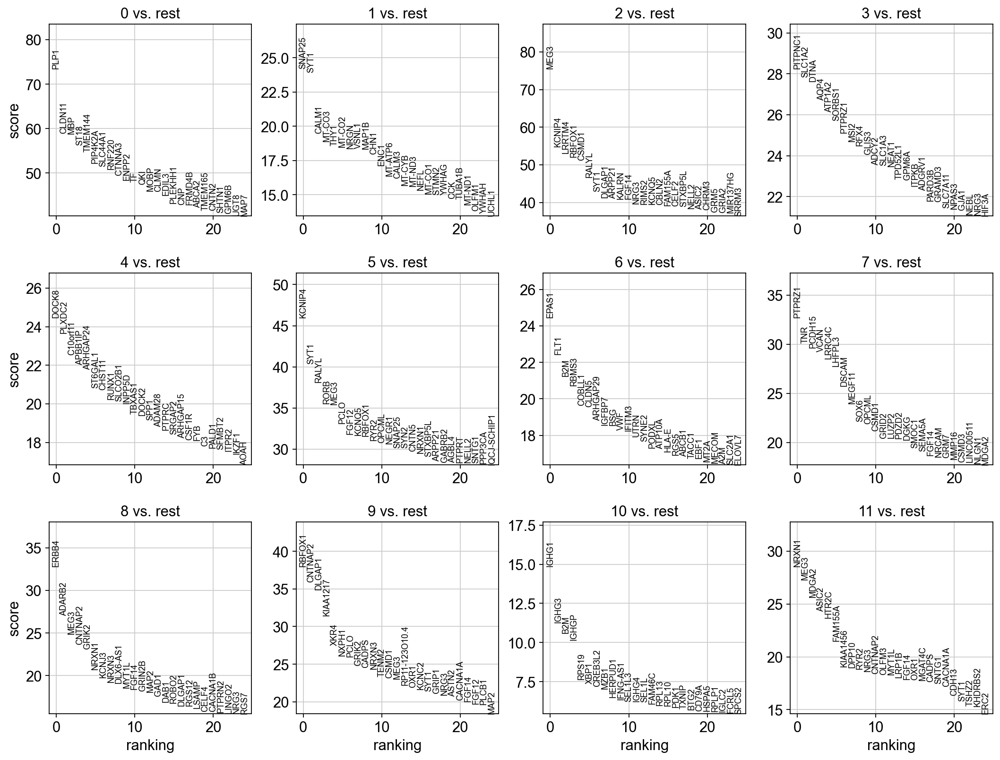

In [197]:
sc.tl.rank_genes_groups(adata, 'leiden_res0_25', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [198]:
neurons_old = adata_donor_assigned_no_doublets[(adata_donor_assigned_no_doublets.obs['bucket'] == 'neurons'), :]
print(neurons_old)

neurons_new_1 = adata_donor_assigned_no_doublets[(adata_donor_assigned_no_doublets.obs['leiden_res0_25'] == '1'), :]
print(neurons_new_1)
neurons_new_5 = adata_donor_assigned_no_doublets[(adata_donor_assigned_no_doublets.obs['leiden_res0_25'] == '5'), :]
print(neurons_new_5)

View of AnnData object with n_obs × n_vars = 867 × 7584
    obs: 'donor_identity', 'donor_id', 'cluster_label', 'lowres_cluster_label', 'sample_id', 'bucket', 'disorder', 'paper_doublet_scores', 'paper_predicted_doublets', 'doublet_score', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'doublet_classification_pipeline', 'newold', 'leiden_new_old', 'leiden_res0_25_new_old'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'donor_identity_colors', 'doublet_classification_pipeline_colors', 'bucket_colors', 'donor_id_colors', 'lowres_cluster_label_colors', 'cluster_label_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


In [199]:
ratio_new_old_neurons = (((len(neurons_new_1.obs) + len(neurons_new_5.obs)) / len(neurons_old.obs)) * 100) - 100
print("We have found", ratio_new_old_neurons, "percent more neurons than in the original count.")

We have found -10.265282583621683 percent more neurons than in the original count.


In [200]:
import anndata as ad
neurons_new = ad.concat([neurons_new_1, neurons_new_5], axis=0)

Comparing the old neuron clusters with the new cells in these clusters.

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


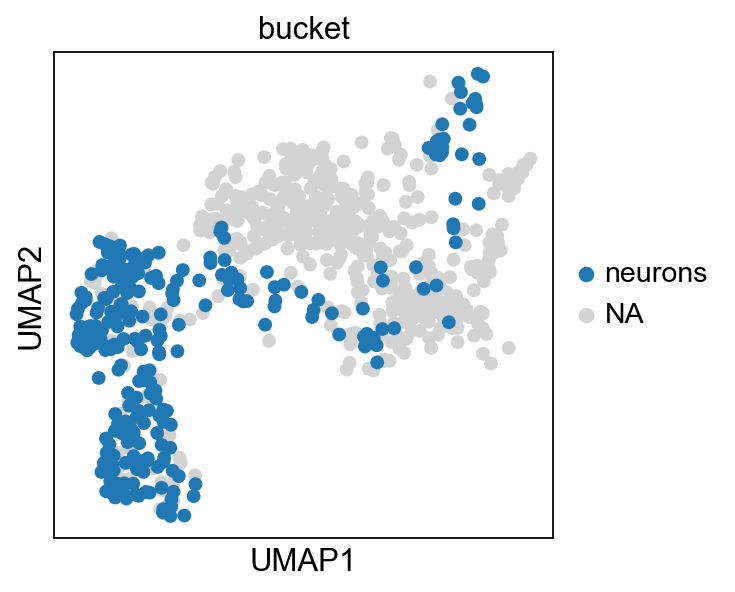

In [201]:
sc.pl.umap(
    neurons_new, save=".png",
    color=["bucket"]
)

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


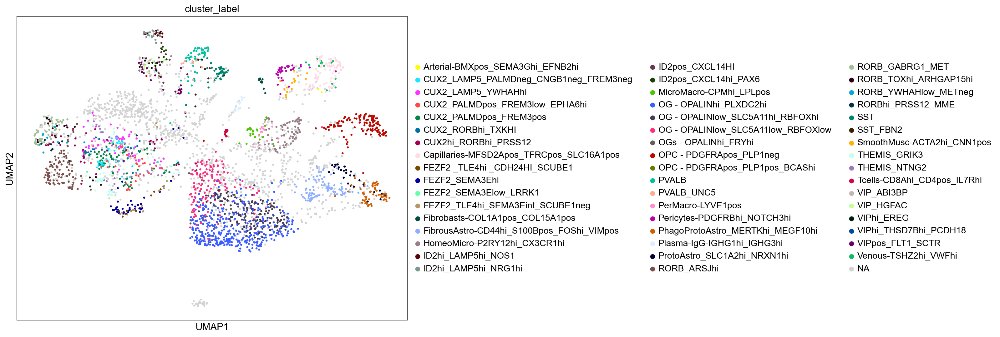

In [202]:
fig, ax = plt.subplots(figsize=(10, 8))
plt.show(sc.pl.umap(adata_donor_assigned_no_doublets, color=["cluster_label"], ax=ax))

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


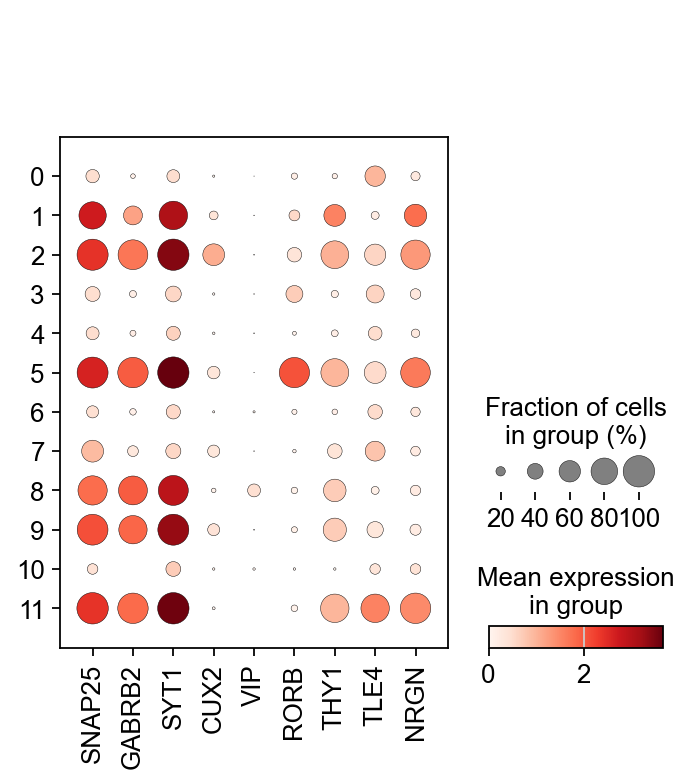

In [203]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, ["SNAP25", "GABRB2", "SYT1", "CUX2", "VIP", "RORB", "THY1", "TLE4", "NRGN"], groupby='leiden_res0_25')

Plotting a small overview of all leiden 0.25 clusters with 3 dotplots with different genes included.

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


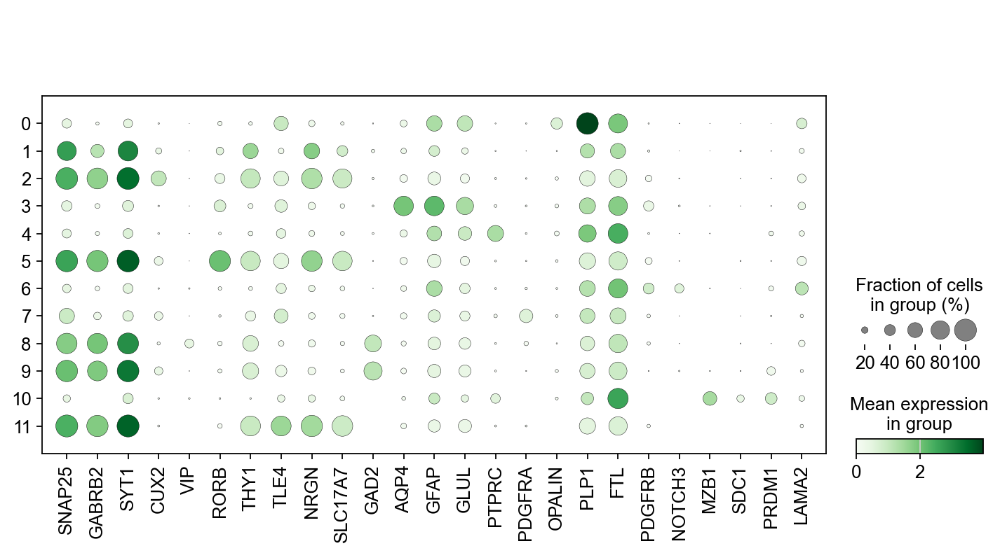

In [204]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, ["SNAP25",
                                                 "GABRB2",
                                                 "SYT1",
                                                 "CUX2",
                                                 "VIP",
                                                 "RORB",
                                                 "THY1",
                                                 "TLE4",
                                                 "NRGN",
                                                 "SLC17A7",
                                                 "GAD2",
                                                 "AQP4",
                                                 "GFAP",
                                                 "GLUL",
                                                 "PTPRC",
                                                 "PDGFRA",
                                                 "OPALIN",
                                                 "PLP1",
                                                 "FTL",
                                                 "PDGFRB",
"NOTCH3",
"MZB1",
"SDC1",
"PRDM1",
"LAMA2",
                                                ], color_map='Greens',groupby='leiden_res0_25')

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


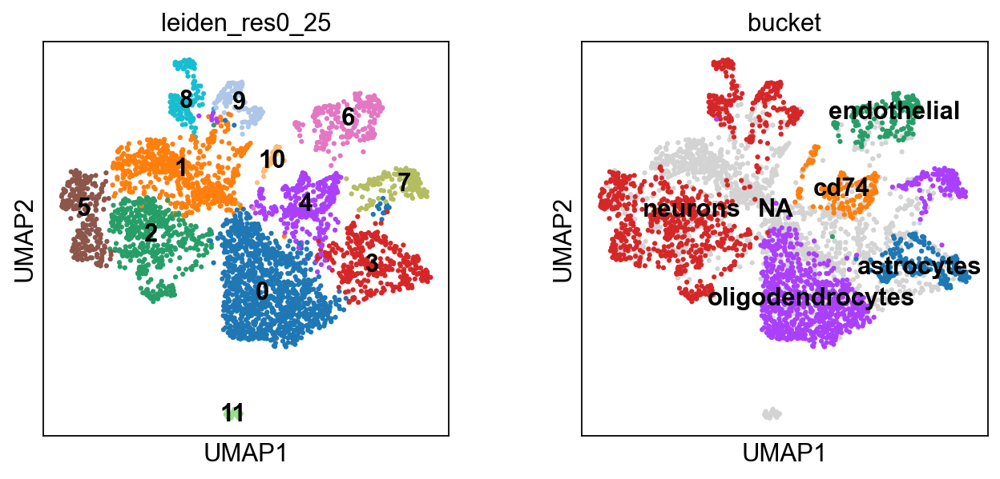

In [205]:
sc.pl.umap(
    adata,
    color=["leiden_res0_25", "bucket"],
    legend_loc="on data", save="leiden025_bucket.png"
)

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


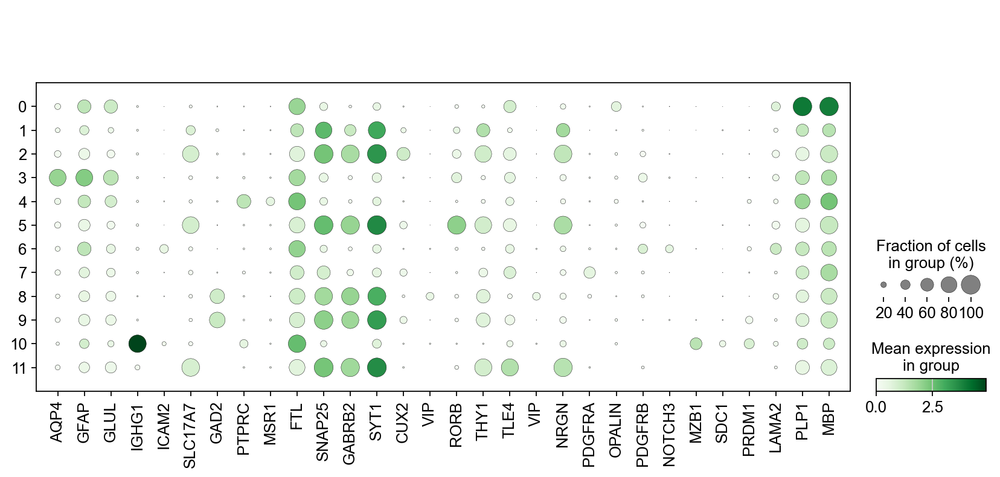

In [206]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, [
"AQP4",
"GFAP",
"GLUL",
"IGHG1",
"ICAM2",
"SLC17A7",
"GAD2",
"PTPRC",
"MSR1",
"FTL",
"SNAP25",
"GABRB2",
"SYT1",
"CUX2",
"VIP",
"RORB",
"THY1",
"TLE4",
"VIP",
"NRGN",
"PDGFRA",
"OPALIN",
"PDGFRB",
"NOTCH3",
"MZB1",
"SDC1",
"PRDM1",
"LAMA2",
"PLP1",
"MBP"
                                                ], color_map='Greens', groupby='leiden_res0_25')

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


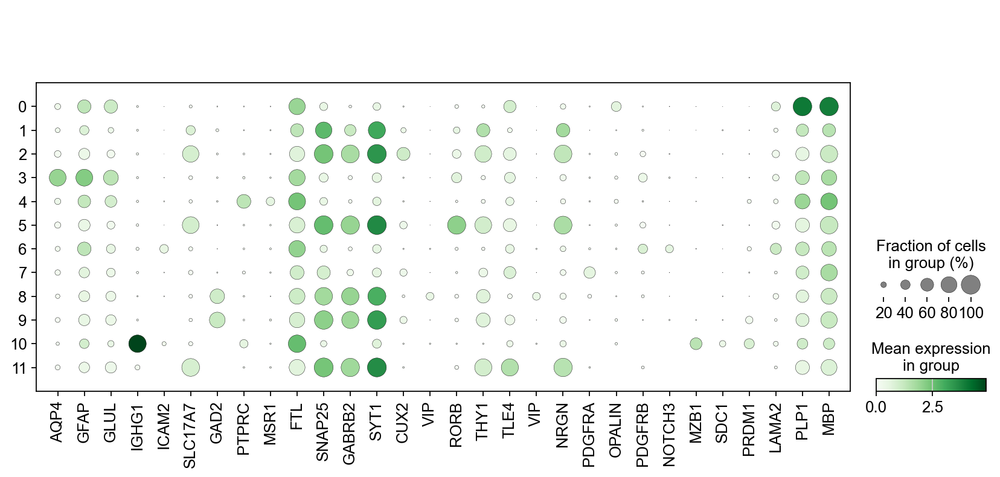

In [207]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, [
"AQP4",
"GFAP",
"GLUL",
"IGHG1",
"ICAM2",
"SLC17A7",
"GAD2",
"PTPRC",
"MSR1",
"FTL",
"SNAP25",
"GABRB2",
"SYT1",
"CUX2",
"VIP",
"RORB",
"THY1",
"TLE4",
"VIP",
"NRGN",
"PDGFRA",
"OPALIN",
"PDGFRB",
"NOTCH3",
"MZB1",
"SDC1",
"PRDM1",
"LAMA2",
"PLP1",
"MBP"
                                                ], color_map='Greens', groupby='leiden_res0_25')

In [208]:
adata_donor_assigned_no_doublets_nan_rows = adata_donor_assigned_no_doublets.obs['bucket'].isna()
adata_donor_assigned_no_doublets_nan = adata_donor_assigned_no_doublets[adata_donor_assigned_no_doublets_nan_rows, :]
adata_donor_assigned_no_doublets_nan

View of AnnData object with n_obs × n_vars = 1238 × 7584
    obs: 'donor_identity', 'donor_id', 'cluster_label', 'lowres_cluster_label', 'sample_id', 'bucket', 'disorder', 'paper_doublet_scores', 'paper_predicted_doublets', 'doublet_score', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'doublet_classification_pipeline', 'newold', 'leiden_new_old', 'leiden_res0_25_new_old'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'donor_identity_colors', 'doublet_classification_pipeline_colors', 'bucket_colors', 'donor_id_colors', 'lowres_cluster_label_colors', 'cluster_label_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [209]:
adata_donor_assigned_no_doublets_not_nan_rows = adata_donor_assigned_no_doublets.obs['bucket'].notna()
adata_donor_assigned_no_doublets_not_nan = adata_donor_assigned_no_doublets[adata_donor_assigned_no_doublets_not_nan_rows, :]
adata_donor_assigned_no_doublets_not_nan

View of AnnData object with n_obs × n_vars = 2224 × 7584
    obs: 'donor_identity', 'donor_id', 'cluster_label', 'lowres_cluster_label', 'sample_id', 'bucket', 'disorder', 'paper_doublet_scores', 'paper_predicted_doublets', 'doublet_score', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'doublet_classification_pipeline', 'newold', 'leiden_new_old', 'leiden_res0_25_new_old'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'donor_identity_colors', 'doublet_classification_pipeline_colors', 'bucket_colors', 'donor_id_colors', 'lowres_cluster_label_colors', 'cluster_label_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


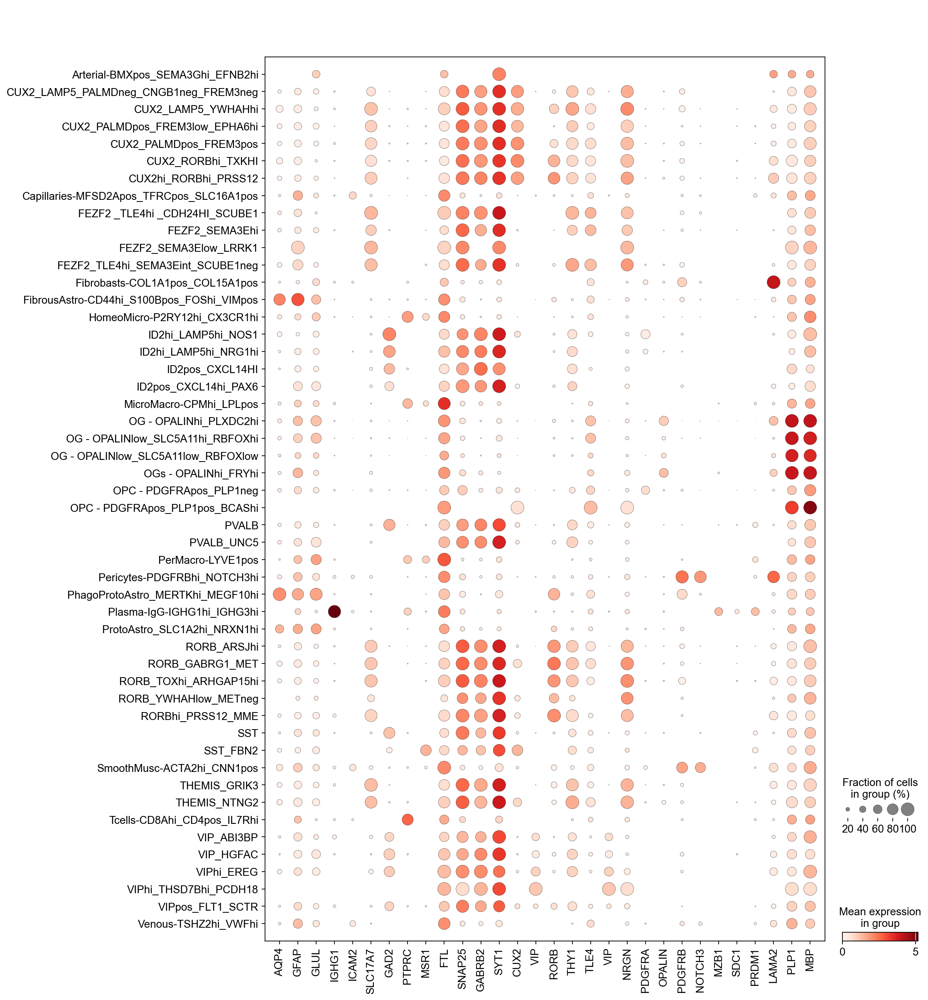

In [210]:
sc.pl.dotplot(adata_donor_assigned_no_doublets_not_nan, [
"AQP4",
"GFAP",
"GLUL",
"IGHG1",
"ICAM2",
"SLC17A7",
"GAD2",
"PTPRC",
"MSR1",
"FTL",
"SNAP25",
"GABRB2",
"SYT1",
"CUX2",
"VIP",
"RORB",
"THY1",
"TLE4",
"VIP",
"NRGN",
"PDGFRA",
"OPALIN",
"PDGFRB",
"NOTCH3",
"MZB1",
"SDC1",
"PRDM1",
"LAMA2",
"PLP1",
"MBP"
                                                ], color_map='Reds', groupby='cluster_label')

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


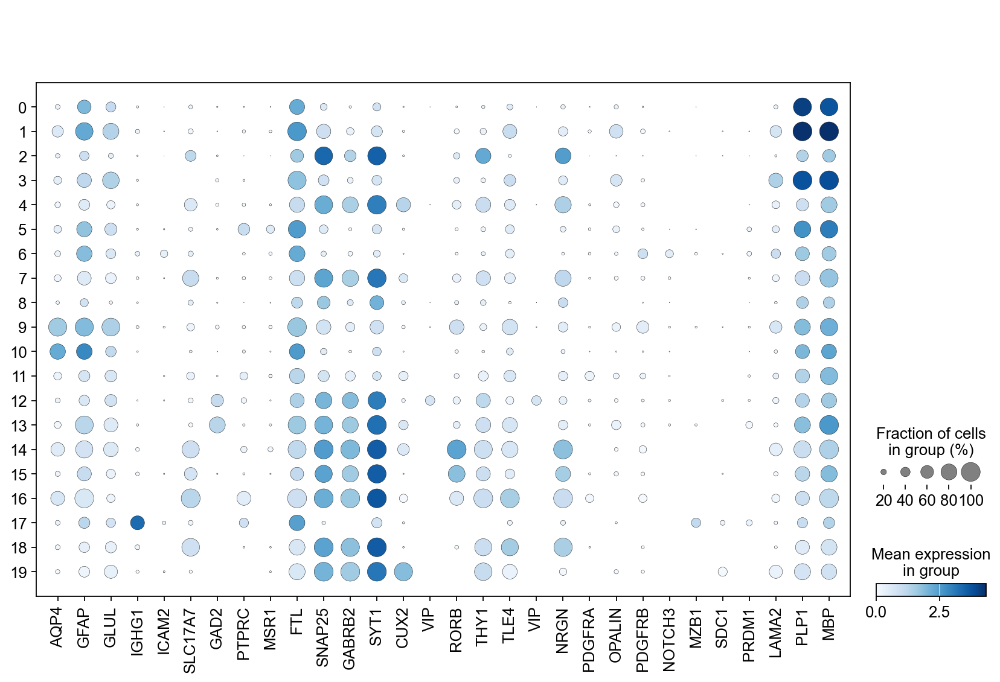

In [211]:
sc.pl.dotplot(adata_donor_assigned_no_doublets_nan, [
"AQP4",
"GFAP",
"GLUL",
"IGHG1",
"ICAM2",
"SLC17A7",
"GAD2",
"PTPRC",
"MSR1",
"FTL",
"SNAP25",
"GABRB2",
"SYT1",
"CUX2",
"VIP",
"RORB",
"THY1",
"TLE4",
"VIP",
"NRGN",
"PDGFRA",
"OPALIN",
"PDGFRB",
"NOTCH3",
"MZB1",
"SDC1",
"PRDM1",
"LAMA2",
"PLP1",
"MBP"
                                                ], color_map='Blues', groupby='leiden')

Big overview for cell Markers.

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


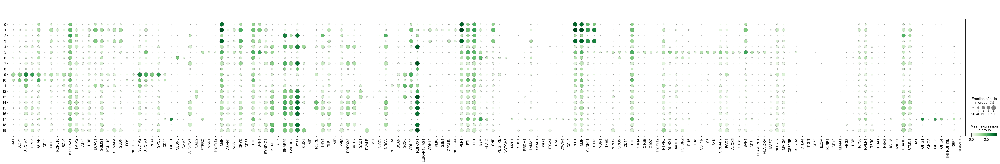

In [212]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, ['GJA1', 'AQP4', 'SLC1A2', 'GPC5', 'GFAP',
'CD44', 'GLUL', 'KCNJ10', 'BCL6', 'HSP90AA1',
'FAIM2', 'ATF4', 'UBB', 'BCAS1', 'SGMS1',
'KCNJ10', 'SEMA6A', 'GLDN', 'FOS', 'LINC01088',
'SLC1A2', 'SLC1A3', 'RFX4', 'GPC5', 'CD44',
'IGHG1', 'CLDN5', 'ICAM2', 'SLC17A7', 'GAD2',
'PTPRC', 'MSR1', 'P2RY12', 'MBP', 'ASAH1',
'ACSL1', 'DPYD', 'CD68', 'FTL', 'SPP1',
'SYNDIG1', 'KCNQ3', 'AIF1', 'SNAP25', 'GABRB2',
'SYT1', 'CUX2', 'VIP', 'RORB', 'THY1',
'TLE4', 'VIP', 'PPIA', 'RBFOX3', 'SATB2',
'GAD1', 'PVALB', 'SST', 'SV2C', 'NRGN',
'PDGFRA', 'BCAN', 'SOX6', 'CDH20', 'RBFOX1',
'LURAP1L-AS1', 'CDH19', 'KLK6', 'GJB1', 'OPALIN',
'LINC00844', 'PLP1',
'FTL', 'FTH1', 'B2M', 'HLA-C', 'CNP',
'PDGFRB', 'NOTCH3', 'MZB1', 'SDC1', 'PRDM1',
'LAMA2', 'SKAP1', 'PRF1', 'ITGA4', 'TRAC',
'CXCR4', 'CCL5', 'PLP1', 'MBP', 'CLDN11',
'ST18', 'MSR1', 'TFEC', 'RUNX2', 'SRGN',
'CD14', 'FTL', 'C1QA', 'C1QB', 'C1QC',
'P2RY12', 'PTPRJ', 'RUNX1', 'BACH1',
'TGFBR2', 'IFI16', 'IL18', 'CSF1R', 'C3',
'SYK', 'SRGAP2', 'FGD4', 'ALOX5',
'CTSC', 'SPP1', 'CD74', 'HLA-DRB1',
'HLA-DRA', 'MAFG', 'NFE2L2',
'MAT2A', 'CSF2RB', 'CSF2RA', 'CTLA4',
'TIGIT', 'CD69', 'IL23R', 'KLRB1',
'CD19', 'MS4A1', 'HBG2', 'HBB', 'RPS6',
'RPLP1', 'TFRC', 'HBA1', 'HBA2', 'IGHM',
'MKI67', 'TUBA1B', 'STMN1', 'IGHA1', 'IGHG1',
'IGHG2', 'IGHG3', 'IGHG4', 'TNFRSF13B', 'XBP1', 'SLAMF7']

                                                , color_map='Greens', groupby='leiden')

Replotted leiden and bucket for reference.

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


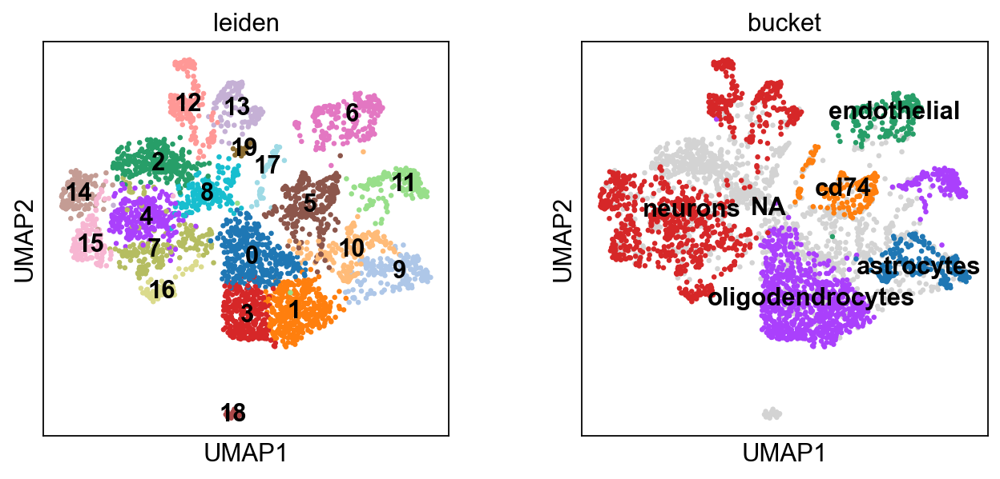

In [213]:
sc.pl.umap(
    adata_donor_assigned_no_doublets,
    color=["leiden", "bucket"],
    legend_loc="on data",
)

In [214]:
adata.obs['newold'] = np.where(pd.isna(adata.obs['bucket']), 'new', 'old')
adata.obs["leiden_new_old"]=adata.obs['leiden'].str.cat(adata.obs['newold'], sep='_')
adata.obs["leiden_res0_25_new_old"]=adata.obs['leiden_res0_25'].str.cat(adata.obs['newold'], sep='_')
adata_donor_assigned_no_doublets.obs['newold'] = np.where(pd.isna(adata_donor_assigned_no_doublets.obs['bucket']), 'new', 'old')
adata_donor_assigned_no_doublets.obs["leiden_new_old"]=adata_donor_assigned_no_doublets.obs['leiden'].str.cat(adata_donor_assigned_no_doublets.obs['newold'], sep='_')
adata_donor_assigned_no_doublets.obs["leiden_res0_25_new_old"]=adata_donor_assigned_no_doublets.obs['leiden_res0_25'].str.cat(adata_donor_assigned_no_doublets.obs['newold'], sep='_')

In [215]:
adata.obs

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets,doublet_score,...,pct_counts_mt,leiden,leiden_res0_25,leiden_res0_5,leiden_res1,leiden_res2,doublet_classification_pipeline,newold,leiden_new_old,leiden_res0_25_new_old
Barcode,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA,donor1,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,control,0.043699,False,0.076372,...,1.170861,4,2,2,4,7,no doublet,old,4_old,2_old
AAACGAAAGAATCTAG-1,Hash452-TotalSeqA,donor5,OG - OPALINlow_SLC5A11hi_RBFOXhi,OG - OPALINlow_SLC5A11hi_RBFOXhi,747495_GX12,oligodendrocytes,ms,0.031493,False,0.068616,...,1.893552,0,0,1,0,3,no doublet,old,0_old,0_old
AAACGAACACATATGC-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.025223,...,6.058158,2,1,4,2,0,no doublet,new,2_new,1_new
AAACGAACATCAGCAT-1,Hash454-TotalSeqA,donor0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.024176,...,7.491367,2,1,4,2,21,no doublet,new,2_new,1_new
AAACGAAGTGCCGTAC-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.305466,...,6.831672,4,2,2,4,32,doublet,new,4_new,2_new
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTAGCACTCAT-1,Hash455-TotalSeqA,donor4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.066225,...,2.453792,10,3,3,10,15,no doublet,new,10_new,3_new
TTTGTTGAGTCCCAGC-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.017520,...,3.639241,0,0,1,0,25,no doublet,new,0_new,0_new
TTTGTTGGTTATCTTC-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.254144,...,0.722064,13,9,11,13,20,doublet,new,13_new,9_new


Showing dotplots comparing new and old cells.

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


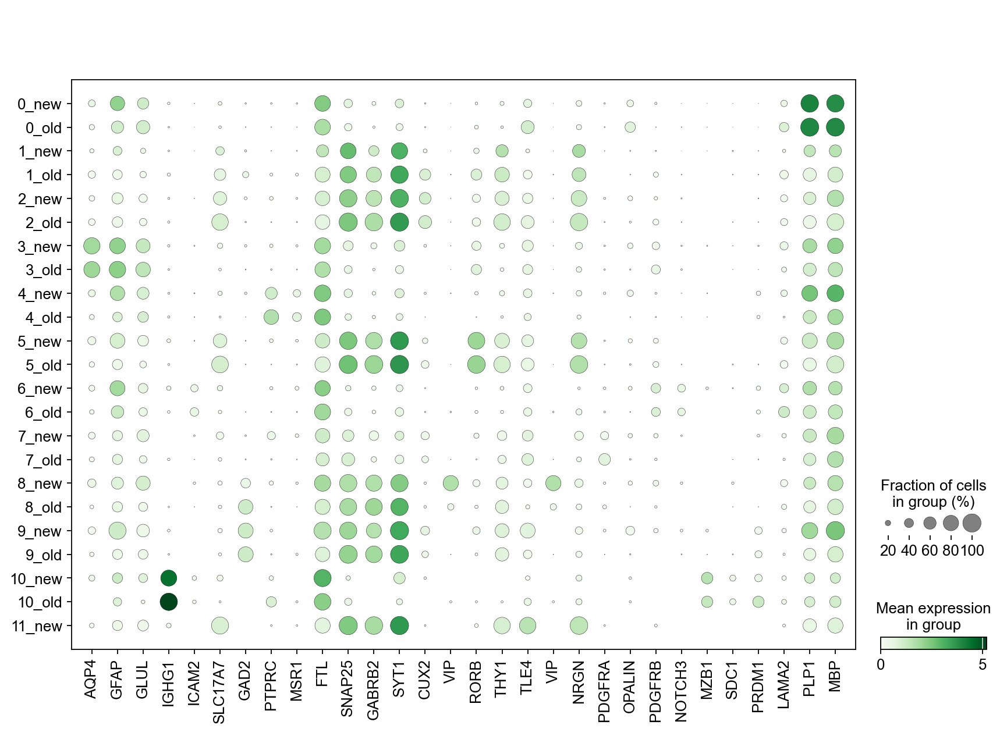

In [216]:
marker_genes = ["AQP4",
"GFAP",
"GLUL",
"IGHG1",
"ICAM2",
"SLC17A7",
"GAD2",
"PTPRC",
"MSR1",
"FTL",
"SNAP25",
"GABRB2",
"SYT1",
"CUX2",
"VIP",
"RORB",
"THY1",
"TLE4",
"VIP",
"NRGN",
"PDGFRA",
"OPALIN",
"PDGFRB",
"NOTCH3",
"MZB1",
"SDC1",
"PRDM1",
"LAMA2",
"PLP1",
"MBP"]
sc.pl.dotplot(adata_donor_assigned_no_doublets, marker_genes, color_map='Greens', save="new_old_leiden025.png", groupby='leiden_res0_25_new_old')

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


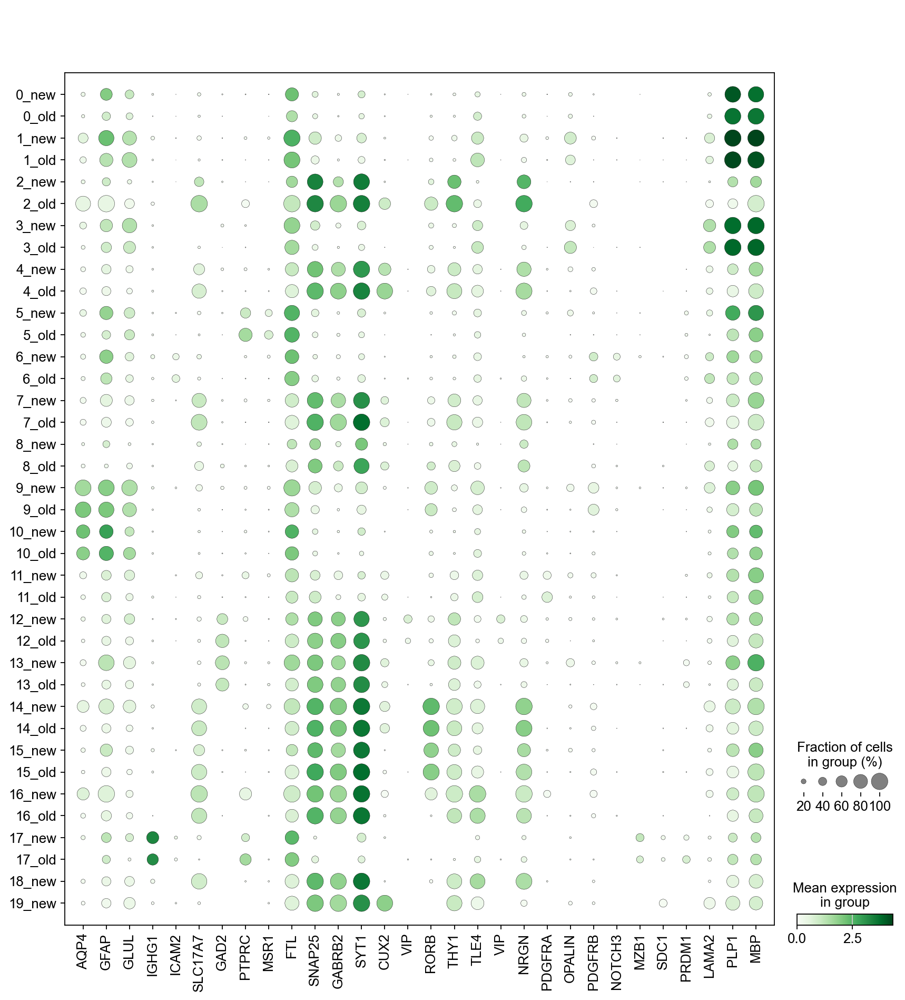

In [217]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, marker_genes, color_map='Greens', save="new_old.png", groupby='leiden_new_old')

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


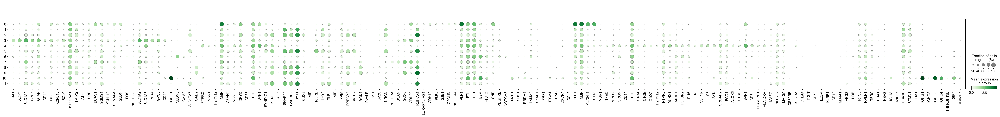

In [218]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, ['GJA1', 'AQP4', 'SLC1A2', 'GPC5', 'GFAP',
'CD44', 'GLUL', 'KCNJ10', 'BCL6', 'HSP90AA1',
'FAIM2', 'ATF4', 'UBB', 'BCAS1', 'SGMS1',
'KCNJ10', 'SEMA6A', 'GLDN', 'FOS', 'LINC01088',
'SLC1A2', 'SLC1A3', 'RFX4', 'GPC5', 'CD44',
'IGHG1', 'CLDN5', 'ICAM2', 'SLC17A7', 'GAD2',
'PTPRC', 'MSR1', 'P2RY12', 'MBP', 'ASAH1',
'ACSL1', 'DPYD', 'CD68', 'FTL', 'SPP1',
'SYNDIG1', 'KCNQ3', 'AIF1', 'SNAP25', 'GABRB2',
'SYT1', 'CUX2', 'VIP', 'RORB', 'THY1',
'TLE4', 'VIP', 'PPIA', 'RBFOX3', 'SATB2',
'GAD1', 'PVALB', 'SST', 'SV2C', 'NRGN',
'PDGFRA', 'BCAN', 'SOX6', 'CDH20', 'RBFOX1',
'LURAP1L-AS1', 'CDH19', 'KLK6', 'GJB1', 'OPALIN',
'LINC00844', 'PLP1',
'FTL', 'FTH1', 'B2M', 'HLA-C', 'CNP',
'PDGFRB', 'NOTCH3', 'MZB1', 'SDC1', 'PRDM1',
'LAMA2', 'SKAP1', 'PRF1', 'ITGA4', 'TRAC',
'CXCR4', 'CCL5', 'PLP1', 'MBP', 'CLDN11',
'ST18', 'MSR1', 'TFEC', 'RUNX2', 'SRGN',
'CD14', 'FTL', 'C1QA', 'C1QB', 'C1QC',
'P2RY12', 'PTPRJ', 'RUNX1', 'BACH1',
'TGFBR2', 'IFI16', 'IL18', 'CSF1R', 'C3',
'SYK', 'SRGAP2', 'FGD4', 'ALOX5',
'CTSC', 'SPP1', 'CD74', 'HLA-DRB1',
'HLA-DRA', 'MAFG', 'NFE2L2',
'MAT2A', 'CSF2RB', 'CSF2RA', 'CTLA4',
'TIGIT', 'CD69', 'IL23R', 'KLRB1',
'CD19', 'MS4A1', 'HBG2', 'HBB', 'RPS6',
'RPLP1', 'TFRC', 'HBA1', 'HBA2', 'IGHM',
'MKI67', 'TUBA1B', 'STMN1', 'IGHA1', 'IGHG1',
'IGHG2', 'IGHG3', 'IGHG4', 'TNFRSF13B', 'XBP1', 'SLAMF7']

                                                , color_map='Greens', groupby='leiden_res0_25')

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


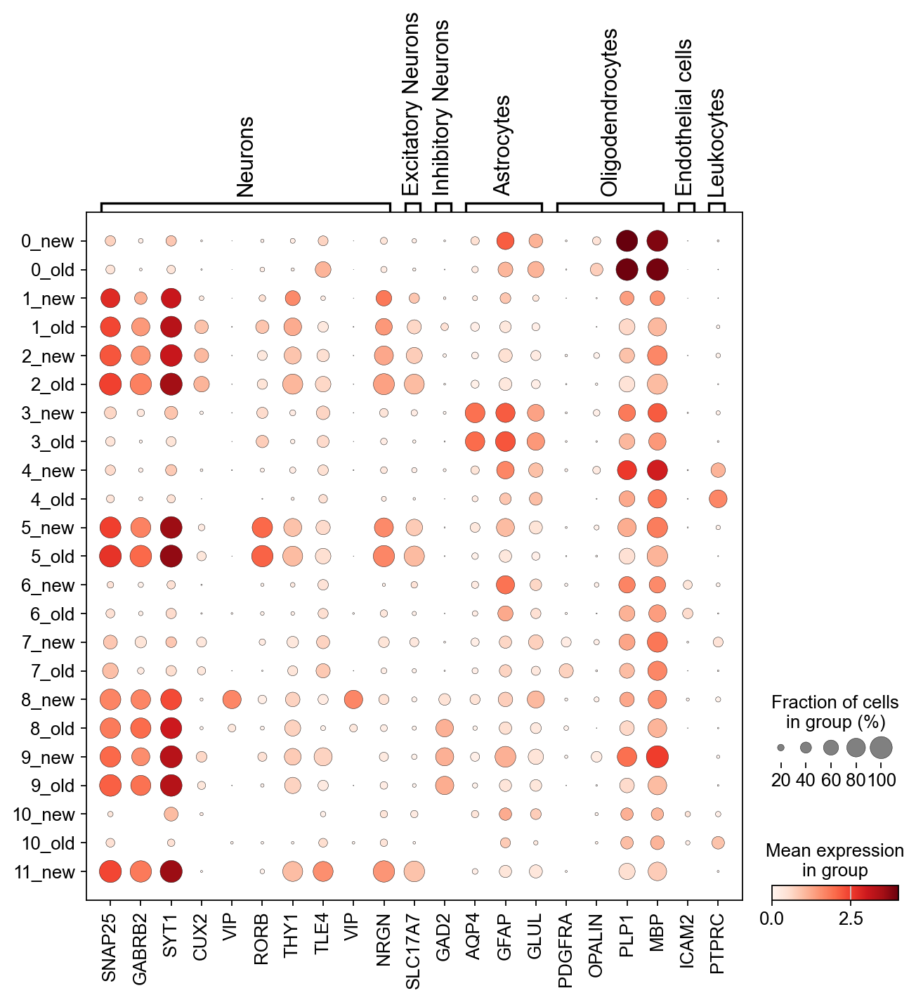

In [219]:
marker_genes_dict = {
    'Neurons': ["SNAP25", "GABRB2", "SYT1", "CUX2", "VIP", "RORB", "THY1", "TLE4", "VIP", "NRGN"],
    'Excitatory Neurons': ['SLC17A7'],
    'Inhibitory Neurons': ['GAD2'],
    'Astrocytes': ["AQP4", "GFAP", "GLUL"],
    'Oligodendrocytes': ["PDGFRA", "OPALIN", "PLP1", "MBP"],
    'Endothelial cells': "ICAM2",
    'Leukocytes': "PTPRC"
}
sc.pl.dotplot(adata_donor_assigned_no_doublets, marker_genes_dict,groupby='leiden_res0_25_new_old')

Looking at the different doublet scores and n_genes to figure out differences as seen in the violin plot above.

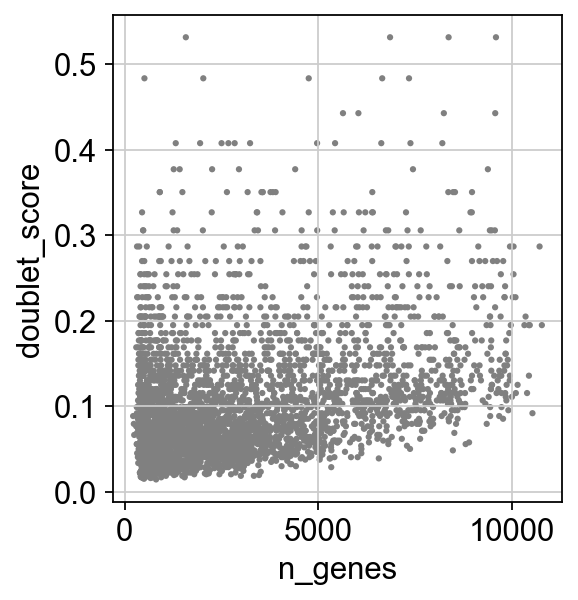

In [220]:
sc.pl.scatter(adata, x='n_genes', y='doublet_score')

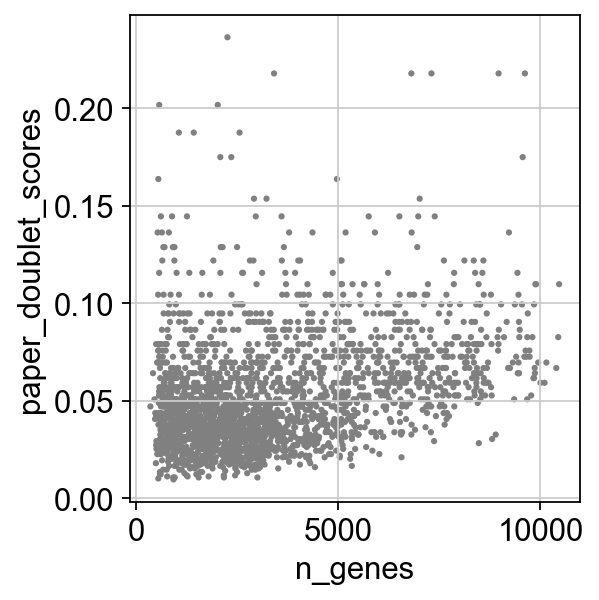

In [221]:
sc.pl.scatter(adata, x='n_genes', y='paper_doublet_scores')

In [222]:
adata.var

,gene_ids,feature_types,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm,mean,std
AP006222.2,ENSG00000228463,Gene Expression,868,False,868,0.272299,82.242226,1331.0,True,0.242710,1.843250,0.723333,-1.198032e-11,0.348494
SAMD11,ENSG00000187634,Gene Expression,83,False,83,0.020867,98.301964,102.0,True,0.040295,1.957855,0.849139,-2.353141e-11,0.149039
NOC2L,ENSG00000188976,Gene Expression,752,False,752,0.200900,84.615385,982.0,True,0.211598,1.757731,0.629456,6.919920e-11,0.333364
HES4,ENSG00000188290,Gene Expression,449,False,449,0.212357,90.814239,1038.0,True,0.254199,2.451382,1.390900,3.589191e-10,0.378165
ISG15,ENSG00000187608,Gene Expression,259,False,259,0.073854,94.701309,361.0,True,0.111101,2.011138,0.907629,-5.003682e-11,0.249682
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SPATC1L,ENSG00000160284,Gene Expression,244,False,244,0.058306,95.008183,285.0,True,0.068149,1.831300,0.710215,-3.433899e-12,0.188058
MCM3AP-AS1,ENSG00000215424,Gene Expression,414,False,414,0.112520,91.530278,550.0,True,0.129985,1.897361,0.782732,-1.114178e-10,0.260254
YBEY,ENSG00000182362,Gene Expression,328,False,328,0.078355,93.289689,383.0,True,0.095856,1.814782,0.692082,-3.384844e-11,0.222841
S100B,ENSG00000160307,Gene Expression,1974,False,1974,1.112520,59.615385,5438.0,True,1.159565,2.802069,0.657981,-4.008503e-10,0.873353


In [223]:
adata.obs

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets,doublet_score,...,pct_counts_mt,leiden,leiden_res0_25,leiden_res0_5,leiden_res1,leiden_res2,doublet_classification_pipeline,newold,leiden_new_old,leiden_res0_25_new_old
Barcode,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA,donor1,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,control,0.043699,False,0.076372,...,1.170861,4,2,2,4,7,no doublet,old,4_old,2_old
AAACGAAAGAATCTAG-1,Hash452-TotalSeqA,donor5,OG - OPALINlow_SLC5A11hi_RBFOXhi,OG - OPALINlow_SLC5A11hi_RBFOXhi,747495_GX12,oligodendrocytes,ms,0.031493,False,0.068616,...,1.893552,0,0,1,0,3,no doublet,old,0_old,0_old
AAACGAACACATATGC-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.025223,...,6.058158,2,1,4,2,0,no doublet,new,2_new,1_new
AAACGAACATCAGCAT-1,Hash454-TotalSeqA,donor0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.024176,...,7.491367,2,1,4,2,21,no doublet,new,2_new,1_new
AAACGAAGTGCCGTAC-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.305466,...,6.831672,4,2,2,4,32,doublet,new,4_new,2_new
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTAGCACTCAT-1,Hash455-TotalSeqA,donor4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.066225,...,2.453792,10,3,3,10,15,no doublet,new,10_new,3_new
TTTGTTGAGTCCCAGC-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.017520,...,3.639241,0,0,1,0,25,no doublet,new,0_new,0_new
TTTGTTGGTTATCTTC-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.254144,...,0.722064,13,9,11,13,20,doublet,new,13_new,9_new


In [224]:
print(adata.obs.keys())

Index(['donor_identity', 'donor_id', 'cluster_label', 'lowres_cluster_label',
       'sample_id', 'bucket', 'disorder', 'paper_doublet_scores',
       'paper_predicted_doublets', 'doublet_score', 'n_genes',
       'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt',
       'leiden', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1',
       'leiden_res2', 'doublet_classification_pipeline', 'newold',
       'leiden_new_old', 'leiden_res0_25_new_old'],
      dtype='object')


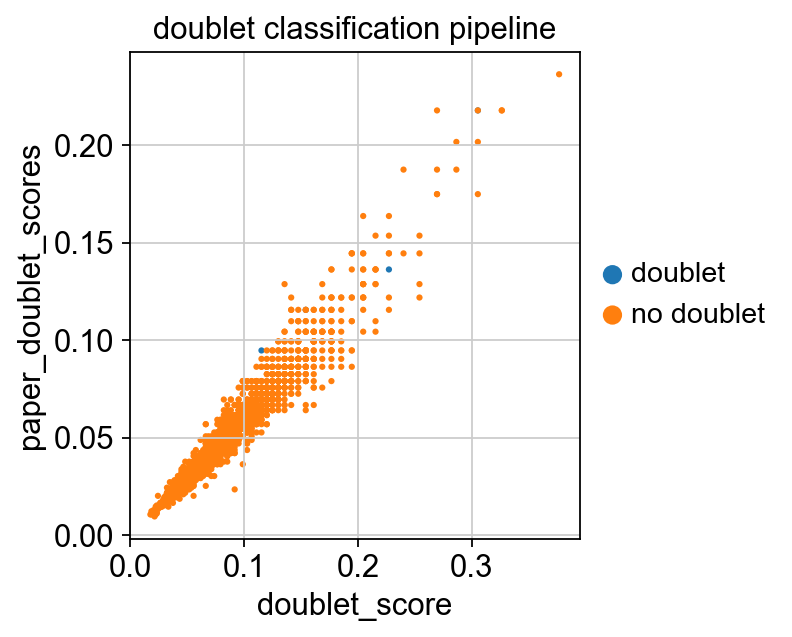

In [225]:
sc.pl.scatter(adata, x='doublet_score', y='paper_doublet_scores', color='doublet_classification_pipeline')

/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lh/opt/anaconda3/envs/DE/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


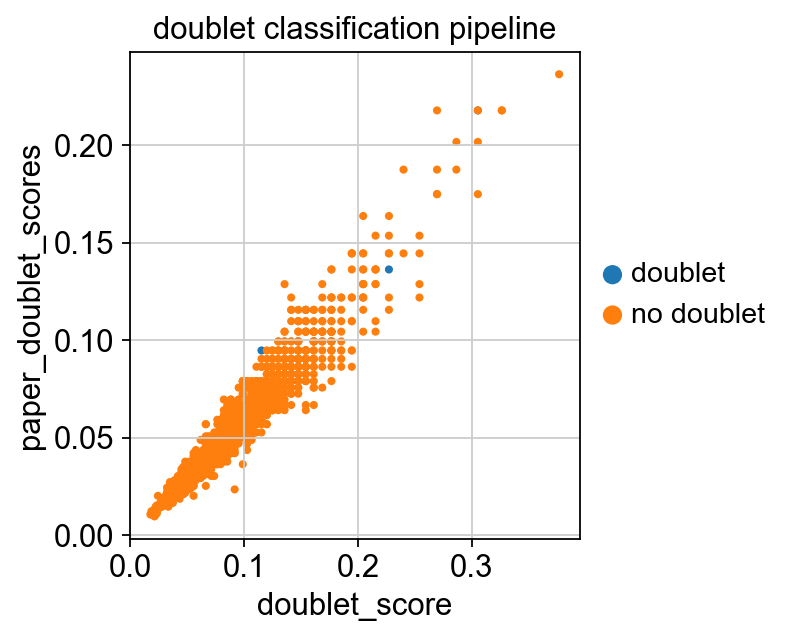

In [226]:
sc.pl.scatter(adata_old, x='doublet_score', y='paper_doublet_scores', color='doublet_classification_pipeline')

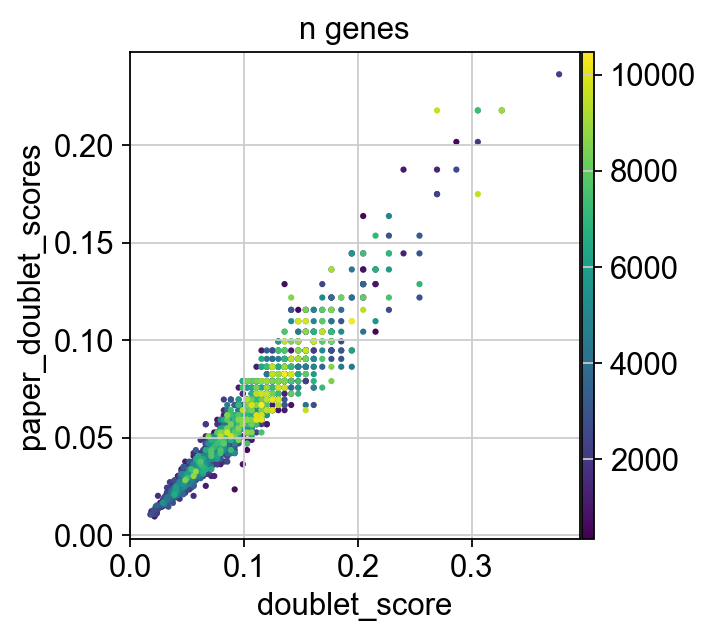

In [227]:
sc.pl.scatter(adata, x='doublet_score', y='paper_doublet_scores', color='n_genes')

In [228]:
adata.obs['paper_predicted_doublets'] = adata.obs['paper_predicted_doublets'].astype(str)
adata.write_h5ad('anndata_post_QC_ms_data_analysis_lennard_24042023_streamlined_with_hashing_info.h5ad')